In [5]:
import warnings
warnings.filterwarnings(action='ignore')

In [9]:
import os
import sys
import os.path as Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [34]:
# Reproducibility
seed = 18
np.random.seed(seed)

In [35]:
project_dir = '..'
if Path.exists(project_dir):
    data_dir = Path.join(project_dir,'data')
    url = Path.join(data_dir,'interim','preprocessed_data.csv')

In [36]:
try:
    df = pd.read_csv(url)
except:
    print('File not found')
    raise
df.head(2)

,image_path,gender_female,gender_male,imagequality_Average,imagequality_Bad,imagequality_Good,age_15-25,age_25-35,age_35-45,age_45-55,...,footwear_CantSee,footwear_Fancy,footwear_Normal,emotion_Angry/Serious,emotion_Happy,emotion_Neutral,emotion_Sad,bodypose_Back,bodypose_Front-Frontish,bodypose_Side
0,..\data\raw\resized/1.jpg,0,1,1,0,0,0,0,1,0,...,0,0,1,0,0,1,0,0,1,0
1,..\data\raw\resized/2.jpg,1,0,1,0,0,0,0,1,0,...,0,0,1,1,0,0,0,0,1,0


In [8]:
# # mount gdrive and unzip data
# from google.colab import drive
# drive.mount('/content/gdrive')
# !unzip -q "/content/gdrive/My Drive/All_Datasets/hvc_data.zip"
# # look for `hvc_annotations.csv` file and `resized` dir
# %ls 

In [37]:
df = df[:70]
df.shape

(70, 28)

In [38]:
df.shape

(70, 28)

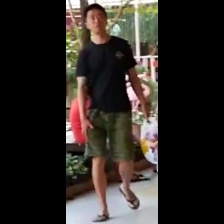

In [48]:
from IPython.display import Image
Image(df.image_path[0])

In [78]:
# Class to generate batches of image data to be fed to model
# inclusive of both original data and augmented data


# example 
        # train_gen = PersonDataGenerator(
        #     train_df, 
        #     batch_size=32, 
        #     aug_list=[
        #         ImageDataGenerator(rotation_range=45),
        #         ImageDataGenerator(horizontal_flip=True),
        #         ImageDataGenerator(vertical_flip=True),
        #     ],
        #     incl_orig=True,  # Whether to include original images
        # )


import os
import os.path as path
import numpy as np
import keras
import cv2
from keras.preprocessing.image import ImageDataGenerator, img_to_array


class PersonDataGenerator(keras.utils.Sequence):
    def __init__(self, df, batch_size=32, shuffle=True, aug_list=[], incl_orig=True):
        """        Ground truth data batch generator    """
        self.df = df
        self.batch_size=batch_size
        self.shuffle = shuffle
        self.on_epoch_end()
        
        self.aug_list = aug_list
        self.incl_orig = incl_orig
        self.orig_len = int(np.floor(self.df.shape[0] / self.batch_size))


        # Label columns per attribute
        self._gender_cols_          = [col for col in df.columns if col.startswith("gender")]
        self._imagequality_cols_    = [col for col in df.columns if col.startswith("imagequality")]
        self._age_cols_             = [col for col in df.columns if col.startswith("age")]
        self._weight_cols_          = [col for col in df.columns if col.startswith("weight")]
        self._carryingbag_cols_     = [col for col in df.columns if col.startswith("carryingbag")]
        self._footwear_cols_        = [col for col in df.columns if col.startswith("footwear")]
        self._emotion_cols_         = [col for col in df.columns if col.startswith("emotion")]
        self._bodypose_cols_        = [col for col in df.columns if col.startswith("bodypose")]


    def __len__(self):
        """
        Number of batches in the Sequence(i.e per epoch).
        """

        if self.incl_orig:
            delta = 1
        else:
            delta = 0
        return self.orig_len * (len(self.aug_list) + delta)

    def __getitem__(self, index):
        """
        Gets batches of images - generates sets of images 
        based on augementation strategies, can include 
        original images as well - Original images will be 
        rescaled while generating batches

        fetch batches of image data and targets        
        """
        if not self.incl_orig :
            index += self.orig_len - 1

        if index > self.orig_len - 1:
            aug = self.aug_list[index // self.orig_len - 1]
            index %= self.orig_len
        else:
            aug = None

        batch_slice = slice(index * self.batch_size, (index + 1) * self.batch_size)
        items = self.df.iloc[batch_slice]
        images = []
        for _, item in items.iterrows():
            image = cv2.imread(item["image_path"])
            image = image.astype(np.float64)
            image /= 255.0
            images.append(image)
        images = np.stack(images)
        
        if aug is not None:
            images = aug.flow(images, shuffle=False).next()
        
        target = {
            "gender_output"         : items[self._gender_cols_].values,
            "image_quality_output"  : items[self._imagequality_cols_].values,
            "age_output"            : items[self._age_cols_].values,
            "weight_output"         : items[self._weight_cols_].values,
            "bag_output"            : items[self._carryingbag_cols_].values,
            "pose_output"           : items[self._bodypose_cols_].values,
            "footwear_output"       : items[self._footwear_cols_].values,
            "emotion_output"        : items[self._emotion_cols_].values,
            }
        
        return images, target

    def on_epoch_end(self):
        """
        Shuffles/sample the df and thereby 
        updates indexes after each epoch
        
        Method called at the end of every epoch.        
        """
        if self.shuffle == True:
            self.df = self.df.sample(frac=1).reset_index(drop=True)




Using TensorFlow backend.


In [80]:
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df, test_size=0.4, random_state=18)
train_df.shape, val_df.shape

((42, 28), (28, 28))

In [81]:
def blur(img):
    return (cv2.blur(img,(5,5)))

def get_random_eraser(input_img, p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
    img_h, img_w, img_c = input_img.shape
    p_1 = np.random.rand()

    if p_1 > p:
        return input_img

    while True:
        s = np.random.uniform(s_l, s_h) * img_h * img_w
        r = np.random.uniform(r_1, r_2)
        w = int(np.sqrt(s / r))
        h = int(np.sqrt(s * r))
        left = np.random.randint(0, img_w)
        top = np.random.randint(0, img_h)

        if left + w <= img_w and top + h <= img_h:
            break

    if pixel_level:
        c = np.random.uniform(v_l, v_h, (h, w, img_c))
    else:
        c = np.random.uniform(v_l, v_h)

    input_img[top:top + h, left:left + w, :] = c

    return input_img
    

def blur_cutout(img):
    img =blur(img)
    img = get_random_eraser(img)
    return img


In [85]:
train_aug = ImageDataGenerator(rescale=1/255.0,horizontal_flip=True)

train_aug1 = ImageDataGenerator(rescale=1/255.0, preprocessing_function=blur_cutout)

train_aug2 = ImageDataGenerator(rescale=1/255.0,
                                        rotation_range=10)
train_aug3 = ImageDataGenerator(rescale=1/255.0,
                                        brightness_range=[0.2,0.8])
train_aug4 = ImageDataGenerator(rescale=1/255.0,
                                        channel_shift_range=100)

# val_aug = ImageDataGenerator(rescale=1/255.0)

In [86]:
train_gen = PersonDataGenerator(
    train_df, 
    batch_size=32, 
    aug_list=[train_aug, train_aug1, train_aug2, train_aug3, train_aug4],
    incl_orig=True,  # Whether to include original images
)

valid_gen = PersonDataGenerator(
    val_df, 
    batch_size=32, 
    aug_list=[],
    incl_orig=True,  # Whether to include original images
)



In [22]:
# # create train and validation data generators


# train_gen = PersonDataGenerator(train_df, batch_size=32, 
#                                 input_size=(224, 224), location = data_dir, 
#                                 augmentations=train_aug, shuffle=True)

# valid_gen = PersonDataGenerator(val_df, batch_size=32, 
#                                 input_size=(224, 224), location = data_dir, 
#                                 augmentations=val_aug)

In [94]:
# get number of output units from data
images, targets = next(iter(train_gen))
num_units = { k.split("_output")[0]:v.shape[1] for k, v in targets.items()}
num_units

{'gender': 2,
 'image_quality': 3,
 'age': 5,
 'weight': 4,
 'bag': 3,
 'pose': 3,
 'footwear': 3,
 'emotion': 4}

In [100]:
images[0].shape

(224, 224, 3)

In [95]:
len(images)

32

In [96]:
# %tensorflow_version 1.x

import cv2
import json

import numpy as np
import pandas as pd

from functools import partial
from pathlib import Path 
from tqdm import tqdm

# from google.colab.patches import cv2_imshow

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder


# from keras.applications import VGG16
from keras.layers.core import Dropout
from keras.layers.core import Flatten
from keras.layers.core import Dense
from keras.layers import Input
from keras.models import Model
from keras.optimizers import SGD
from keras.preprocessing.image import ImageDataGenerator


In [105]:
from keras.layers import Conv2D, MaxPooling2D, DepthwiseConv2D, SeparableConv2D
from keras.layers import Dense, Dropout, Activation, Flatten, Add, BatchNormalization, GlobalAveragePooling2D
from keras.applications.resnet_v2 import ResNet152V2

In [106]:
input_shape = (224, 224, 3)
inputs = Input(shape=input_shape)
# Block1
conv1 = Conv2D(32, 3, padding="same",
               use_bias=False, activation='relu', 
               kernel_initializer='he_normal')(inputs)
bn1 = BatchNormalization()(conv1)
# Block2
conv2 = Conv2D(32, 3, padding="same",
               use_bias=False, activation='relu', 
               kernel_initializer='he_normal')(bn1)
bn2 = BatchNormalization()(conv2)
dp2 = Dropout(0.05)(bn2)
mp1 = MaxPooling2D(2)(dp2)
c3 = Conv2D(27, 1, use_bias=False)(mp1)
gp = GlobalAveragePooling2D()(c3)
output = Activation('softmax')(gp)

model = Model(inputs=inputs, outputs=output)

In [107]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 224, 224, 32)      864       
_________________________________________________________________
batch_normalization_5 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 224, 224, 32)      9216      
_________________________________________________________________
batch_normalization_6 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
dropout_3 (Dropout)          (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 112, 112, 32)      0   

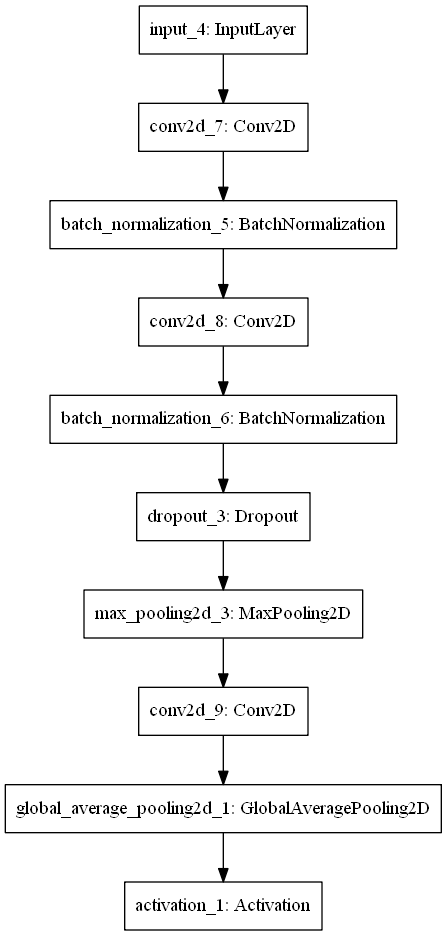

In [108]:
from keras.utils import plot_model
plot_model(model)

In [109]:
input_shape = (224, 224, 3)
inputs = Input(shape=input_shape)
# Block1
conv1 = SeparableConv2D(32, 3, padding="same",
               use_bias=False, activation='relu', 
               kernel_initializer='he_normal')(inputs)
bn1 = BatchNormalization()(conv1)
# Block2
conv2 = SeparableConv2D(32, 3, padding="same",
               use_bias=False, activation='relu', 
               kernel_initializer='he_normal')(bn1)
bn2 = BatchNormalization()(conv2)
dp2 = Dropout(0.05)(bn2)
mp1 = MaxPooling2D(2)(dp2)
c3 = Conv2D(27, 1, use_bias=False)(mp1)
gp = GlobalAveragePooling2D()(c3)
output = Activation('softmax')(gp)

model1 = Model(inputs=inputs, outputs=output)

In [112]:
model1.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
separable_conv2d_1 (Separabl (None, 224, 224, 32)      123       
_________________________________________________________________
batch_normalization_7 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
separable_conv2d_2 (Separabl (None, 224, 224, 32)      1312      
_________________________________________________________________
batch_normalization_8 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
dropout_4 (Dropout)          (None, 224, 224, 32)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 112, 112, 32)      0   

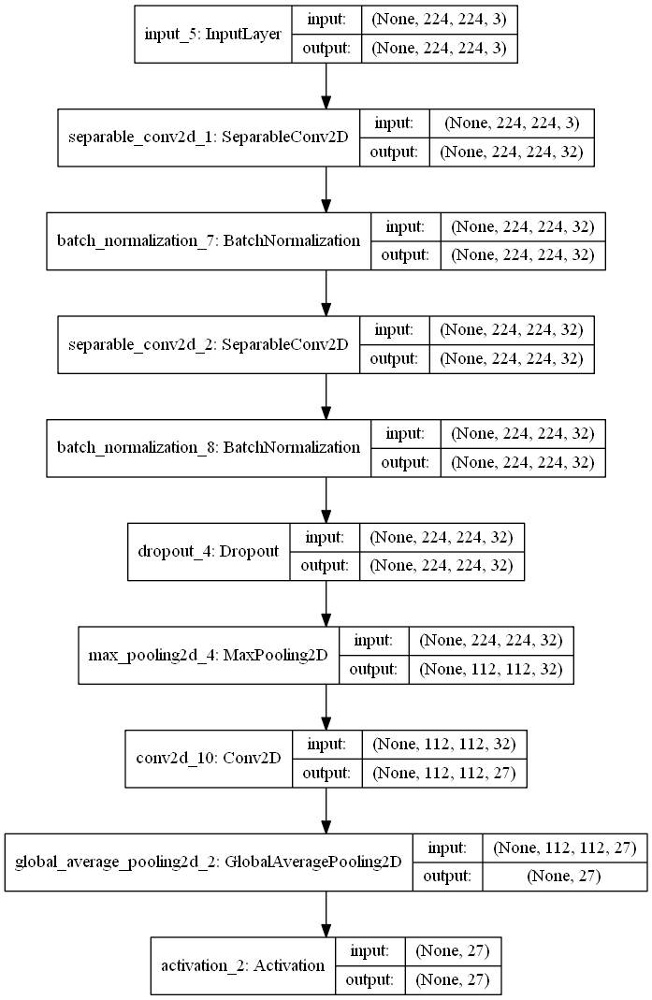

In [111]:
from keras.utils import plot_model
plot_model(model1, show_shapes=True)

In [110]:
plot_model?

In [ ]:
from __future__ import division

import six
from keras.models import Model
from keras.layers import (
    Input,
    Activation,
    Dense,
    Flatten
)
from keras.layers.convolutional import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D
)
from keras.layers.merge import add
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras import backend as K

In [145]:
from keras.regularizers import l2
from keras import backend as K
from keras.layers.merge import add


In [170]:
def _bn_relu(input):
    """Helper to build a BN -> relu block
    """
    norm = BatchNormalization()(input)
    return Activation("relu")(norm)


def _conv_bn_relu(**kwargs):
    """Helper to build a conv -> BN -> relu block
    """
    filters = kwargs["filters"]
    kernel_size = kwargs["kernel_size"]
    strides = kwargs.setdefault("strides", (1, 1))
    kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
    padding = kwargs.setdefault("padding", "same")
    kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
    dropout = kwargs.setdefault("dropout", False)

    def f(input): # to be able to take input layer as input and return back layer
        conv = Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer)(input)
    #                   ,kernel_regularizer=kernel_regularizer)(input)
        if dropout:
            actv = _bn_relu(conv)
            return Dropout(dropout)(actv)

        return _bn_relu(conv)
    return f

def _bn_relu_conv(**kwargs):
    """Helper to build a BN -> relu -> conv block.
    This is an improved scheme proposed in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
    """
    filters = kwargs["filters"]
    kernel_size = kwargs["kernel_size"]
    strides = kwargs.setdefault("strides", (1, 1))
    kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
    padding = kwargs.setdefault("padding", "same")
    kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
    dropout = kwargs.setdefault("dropout", False)

    def f(input):

        activation = _bn_relu(input)
        if dropout:
            conv = Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer)(activation)
            return Dropout(dropout)(conv)

        return Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer)(activation)
    #                   ,kernel_regularizer=kernel_regularizer)(activation)
    return f


def bottleneck_block(filters, init_strides=(1, 1), is_first_layer_of_first_block=False):
    """Bottleneck architecture for deeper resnet.
    Follows improved proposed scheme in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
    """
    def f(input): 
        if is_first_layer_of_first_block:
            # don't repeat bn->relu since we just did bn->relu->maxpool
            conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                              strides=init_strides,
                              padding="same",
                              kernel_initializer="he_normal",
                              kernel_regularizer=l2(1e-4))(input)
        else:
            conv_1_1 = _bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                     strides=init_strides)(input)

        conv_3_3 = _bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
        residual = _bn_relu_conv(filters=filters, kernel_size=(1, 1))(conv_3_3)

        return _add_shortcut(input, residual)

    return f


In [171]:
def _add_shortcut(input, residual):
    """Adds a shortcut between input and residual block and merges them with "sum"
    """
    # Expand channels of shortcut to match residual.
    # Stride appropriately to match residual (width, height)
    # Should be int if network architecture is correctly configured.

    input_shape = K.int_shape(input)
    residual_shape = K.int_shape(residual)
    
    if K.common.image_dim_ordering() == 'tf':
        row_axis = 1
        col_axis = 2
        channel_axis = 3
    else:
        channel_axis = 1
        row_axis = 2
        col_axis = 3

    stride_width = int(round(input_shape[row_axis] / residual_shape[row_axis]))
    stride_height = int(round(input_shape[col_axis] / residual_shape[col_axis]))
    equal_channels = input_shape[channel_axis] == residual_shape[channel_axis]
    print('input_shape[row_axis], residual_shape[row_axis] :', input_shape[row_axis] , residual_shape[row_axis])
    print('input_shape[col_axis], residual_shape[col_axis] :', input_shape[col_axis] , residual_shape[col_axis])
    print('input_shape[channel_axis], residual_shape[channel_axis] :', input_shape[channel_axis] , residual_shape[channel_axis])
    print('row_axis, col_axis, channel_axis : ', row_axis, col_axis, channel_axis)
    shortcut = input

    if stride_width > 1 or stride_height > 1 or not equal_channels:
    # 1 X 1 conv if shape is different. Else identity.
        shortcut = Conv2D(filters=residual_shape[channel_axis],
                          kernel_size=(1, 1),
                          strides=(stride_width, stride_height),
                          padding="valid",
                          kernel_initializer="he_normal",
                          kernel_regularizer=l2(0.0001))(input)

    return add([shortcut, residual])



In [192]:
class CustomResnetBuilder(object):
    def __init__(self, input_tensor, num_outputs, block_repititions):
        self.input_tensor = input_tensor
        self.input_shape = K.int_shape(input_tensor)
        self.num_outputs = num_outputs
        self.block_repititions = block_repititions
        self.output = self.build()
        
    def build(self):
        """Builds a custom ResNet like architecture.
        Args:
            input_shape: The input shape in the form (nb_channels, nb_rows, nb_cols)
            num_outputs: The number of outputs at final softmax layer
            block_fn: The block function to use. This is either `basic_block` or `bottleneck`.
                The original paper used basic_block for layers < 50
            repetitions: Number of repetitions of various block units.
                At each block unit, the number of filters are doubled and the input size is halved
        Returns:
            The keras `Model`.
        """
        
        input_tensor = Input(shape=self.input_shape)

        conv1 = _conv_bn_relu(filters=32, kernel_size=(3, 3), padding="same")(input_tensor)
        conv2 = _conv_bn_relu(filters=64, kernel_size=(3, 3), padding="same", dropout=0.05)(conv1)

        block_input = conv2
        filters = 64

        for tower_num, tower_size in enumerate(self.block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = bottleneck_block(filters, init_strides)(block_input)
        
        # Last activation
        tower = _bn_relu(block_input)
        drop = Dropout(0.2)(tower)
        
        # Seperate tower for each class

        
        for tower_num, tower_size in enumerate(self.block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = bottleneck_block(filters, init_strides)(block_input)

        
        
        
        fconv = Conv2D(num_outputs, 1)(drop)
        gap = GlobalAveragePooling2D()(fconv)
        output = Activation('softmax')(gap)
#         return output
        return Model(inputs=input_tensor, outputs=output)
        

Receptive field of each bottleneck block will add a recpetive field in multiple of 4 based  since it comes after a stride of 2 (when with maxpool layer).

Since any 3x3 kernel will increase the receptive field in multiples of 4x(number of stride 2 used previously)



I'll keep the 

In [193]:
output1 =  CustomResnetBuilder.build((224, 224,3), 27, [2,1])

input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 64 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 128 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 112 112
input_shape[col_axis], residual_shape[col_axis] : 112 112
input_shape[channel_axis], residual_shape[channel_axis] : 128 256
row_axis, col_axis, channel_axis :  1 2 3


In [194]:
output1.summary()

Model: "model_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_30 (InputLayer)           (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_256 (Conv2D)             (None, 224, 224, 32) 896         input_30[0][0]                   
__________________________________________________________________________________________________
batch_normalization_210 (BatchN (None, 224, 224, 32) 128         conv2d_256[0][0]                 
__________________________________________________________________________________________________
activation_215 (Activation)     (None, 224, 224, 32) 0           batch_normalization_210[0][0]    
___________________________________________________________________________________________

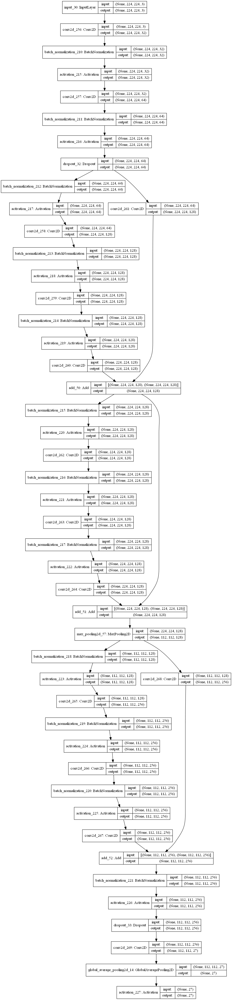

In [195]:
plot_model(output1, show_shapes=True)

In [190]:
# input1 = Input(shape=(224, 224,3))
# output1 =  CustomResnetBuilder.build(input1, 10, [2,1])
# model1 = Model(inputs=input1, outputs =output1)

In [189]:
model10 = CustomResnetBuilder.build((224, 224,3), 27, [2,1])
model10.summary()

input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 64 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 112 112
input_shape[col_axis], residual_shape[col_axis] : 112 112
input_shape[channel_axis], residual_shape[channel_axis] : 128 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 56 56
input_shape[col_axis], residual_shape[col_axis] : 56 56
input_shape[channel_axis], residual_shape[channel_axis] : 128 256
row_axis, col_axis, channel_axis :  1 2 3
Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           (None, 224, 224, 3)  0                                            
__________________

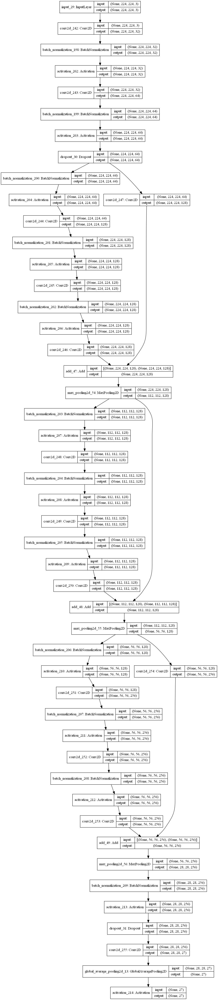

In [191]:
plot_model(model10, show_shapes=True)

In [236]:
from keras.models import Model
from keras.layers import Input, Activation, Dense, Flatten, GlobalAveragePooling2D, Dropout
from keras.layers.convolutional import Conv2D, MaxPooling2D, AveragePooling2D
from keras.layers.merge import add
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras import backend as K


class TwoCustomResnetBuilder(object):
    def __init__(self, input_shape):
        # self.input_tensor = input_tensor
        # self.input_shape = K.int_shape(input_tensor)
        self.input_shape = input_shape
        self.output = self.build()


    def build(self):
        """Builds a custom ResNet like architecture.
        Args:
            input_shape: The input shape in the form (nb_channels, nb_rows, nb_cols)
            num_outputs: The number of outputs at final softmax layer
            block_fn: The block function to use. This is either `basic_block` or `bottleneck`.
                The original paper used basic_block for layers < 50
            repetitions: Number of repetitions of various block units.
                At each block unit, the number of filters are doubled and the input size is halved
        Returns:
            The keras `Model`.
        """
        
        input_tensor = Input(shape=self.input_shape)

        conv1 = self._conv_bn_relu(filters=32, kernel_size=(3, 3), padding="same")(input_tensor)
        conv2 = self._conv_bn_relu(filters=64, kernel_size=(3, 3), padding="same", dropout=0.05)(conv1)

        filters = 64

        backbone = self.build_resnet_tower(conv2, filters=filters, block_repititions=[3])

        gender_activation = "softmax"
        image_quality_activation = "softmax"
        age_activation ="softmax"
        weight_activation = "softmax"
        bag_activation = "softmax"
        footwear_activation = "softmax"
        emotion_activation = "softmax"
        pose_activation = "softmax"

        filters = 64

        # heads
        gender = self.build_label_tower(backbone, "gender", filters=filters, block_repititions=[2, 3], num_outputs=2, activation=gender_activation)

        image_quality = self.build_label_tower(backbone, "image_quality", filters=filters, block_repititions=[3, 3], num_outputs=3, activation=image_quality_activation)

        age = self.build_label_tower(backbone, "age", filters=filters, block_repititions=[3], num_outputs= 5, activation=age_activation)

        weight = self.build_label_tower(backbone, "weight", filters=filters, block_repititions=[2, 2], num_outputs= 4, activation=weight_activation)

        bag = self.build_label_tower(backbone, "bag", filters=filters, block_repititions=[2, 2], num_outputs= 3, activation=bag_activation)

        footwear = self.build_label_tower(backbone, "footwear", filters=filters, block_repititions=[2, 2], num_outputs= 3, activation=footwear_activation)

        emotion = self.build_label_tower(backbone, "emotion", filters=filters, block_repititions=[2, 2], num_outputs= 3, activation=emotion_activation)

        pose = self.build_label_tower(backbone, "pose", filters=filters, block_repititions=[2, 2], num_outputs= 4, activation=pose_activation)

        model = Model(
            inputs=input_tensor, 
            outputs=[gender, image_quality, age, weight, bag, footwear, pose, emotion]
        )
        return model

    def build_label_tower(self, input_tensor, name, filters, block_repititions, num_outputs, activation):
        for tower_num, tower_size in enumerate(block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = self.bottleneck_block(filters, init_strides)(input_tensor)
        # Last activation
        tower = _bn_relu(block_input)
        drop = Dropout(0.2)(tower)
        fconv = Conv2D(num_outputs, 1)(drop)
        gap = GlobalAveragePooling2D()(fconv)
        output = Activation(activation=activation, name=f"{name}_output")(gap)

        return output


    def build_resnet_tower(self, input_tensor, filters, block_repititions):
        for tower_num, tower_size in enumerate(block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = self.bottleneck_block(filters, init_strides)(input_tensor)
        # Last activation
        tower = _bn_relu(block_input)
        return tower


    def _bn_relu(self, input):
        """Helper to build a BN -> relu block
        """
        norm = BatchNormalization()(input)
        return Activation("relu")(norm)


    def _conv_bn_relu(self, **kwargs):
        """Helper to build a conv -> BN -> relu block
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input): # to be able to take input layer as input and return back layer
            conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(input)
        #                   ,kernel_regularizer=kernel_regularizer)(input)
            if dropout:
                actv = self._bn_relu(conv)
                return Dropout(dropout)(actv)

            return self._bn_relu(conv)
        return f

    def _bn_relu_conv(self, **kwargs):
        """Helper to build a BN -> relu -> conv block.
        This is an improved scheme proposed in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input):

            activation = self._bn_relu(input)
            if dropout:
                conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
                return Dropout(dropout)(conv)

            return Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
        #                   ,kernel_regularizer=kernel_regularizer)(activation)
        return f


    def bottleneck_block(self, filters, init_strides=(1, 1), is_first_layer_of_first_block=False):
        """Bottleneck architecture for deeper resnet.
        Follows improved proposed scheme in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        def f(input): 
            if is_first_layer_of_first_block:
                # don't repeat bn->relu since we just did bn->relu->maxpool
                conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                                  strides=init_strides,
                                  padding="same",
                                  kernel_initializer="he_normal",
                                  kernel_regularizer=l2(1e-4))(input)
            else:
                conv_1_1 = self._bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                         strides=init_strides)(input)

            conv_3_3 = self._bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
            residual = self._bn_relu_conv(filters=filters, kernel_size=(1, 1))(conv_3_3)

            return self._add_shortcut(input, residual)

        return f
    
    def _add_shortcut(self, input, residual):
        """Adds a shortcut between input and residual block and merges them with "sum"
        """
        # Expand channels of shortcut to match residual.
        # Stride appropriately to match residual (width, height)
        # Should be int if network architecture is correctly configured.

        input_shape = K.int_shape(input)
        residual_shape = K.int_shape(residual)

        if K.common.image_dim_ordering() == 'tf':
            row_axis = 1
            col_axis = 2
            channel_axis = 3
        else:
            channel_axis = 1
            row_axis = 2
            col_axis = 3

        stride_width = int(round(input_shape[row_axis] / residual_shape[row_axis]))
        stride_height = int(round(input_shape[col_axis] / residual_shape[col_axis]))
        equal_channels = input_shape[channel_axis] == residual_shape[channel_axis]
        print('input_shape[row_axis], residual_shape[row_axis] :', input_shape[row_axis] , residual_shape[row_axis])
        print('input_shape[col_axis], residual_shape[col_axis] :', input_shape[col_axis] , residual_shape[col_axis])
        print('input_shape[channel_axis], residual_shape[channel_axis] :', input_shape[channel_axis] , residual_shape[channel_axis])
        print('row_axis, col_axis, channel_axis : ', row_axis, col_axis, channel_axis)
        shortcut = input

        if stride_width > 1 or stride_height > 1 or not equal_channels:
        # 1 X 1 conv if shape is different. Else identity.
            shortcut = Conv2D(filters=residual_shape[channel_axis],
                              kernel_size=(1, 1),
                              strides=(stride_width, stride_height),
                              padding="valid",
                              kernel_initializer="he_normal",
                              kernel_regularizer=l2(0.0001))(input)

        return add([shortcut, residual])

        
        


In [237]:
model_1 = TwoCustomResnetBuilder((224, 224, 3))

input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 64 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 64 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 64 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 128 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] :

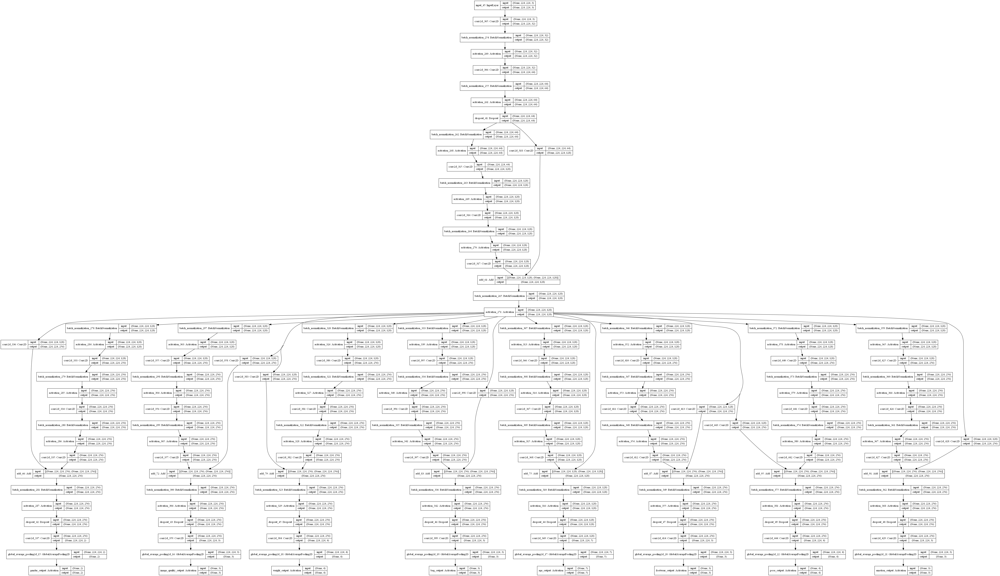

In [240]:
plot_model(model_1.output, show_shapes=True)

In [280]:
from __future__ import division

import six
from keras.models import Model
from keras.layers import (
    Input,
    Activation,
    Dense,
    Flatten
)
from keras.layers.convolutional import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D
)
from keras.layers.merge import add
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras import backend as K


def _bn_relu(input):
    """Helper to build a BN -> relu block
    """
    norm = BatchNormalization(axis=CHANNEL_AXIS)(input)
    return Activation("relu")(norm)


def _conv_bn_relu(**conv_params):
    """Helper to build a conv -> BN -> relu block
    """
    filters = conv_params["filters"]
    kernel_size = conv_params["kernel_size"]
    strides = conv_params.setdefault("strides", (1, 1))
    kernel_initializer = conv_params.setdefault("kernel_initializer", "he_normal")
    padding = conv_params.setdefault("padding", "same")
    kernel_regularizer = conv_params.setdefault("kernel_regularizer", l2(1.e-4))

    def f(input):
        conv = Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer,
                      kernel_regularizer=kernel_regularizer)(input)
        return _bn_relu(conv)

    return f


def _bn_relu_conv(**conv_params):
    """Helper to build a BN -> relu -> conv block.
    This is an improved scheme proposed in http://arxiv.org/pdf/1603.05027v2.pdf
    """
    filters = conv_params["filters"]
    kernel_size = conv_params["kernel_size"]
    strides = conv_params.setdefault("strides", (1, 1))
    kernel_initializer = conv_params.setdefault("kernel_initializer", "he_normal")
    padding = conv_params.setdefault("padding", "same")
    kernel_regularizer = conv_params.setdefault("kernel_regularizer", l2(1.e-4))

    def f(input):
        activation = _bn_relu(input)
        return Conv2D(filters=filters, kernel_size=kernel_size,
                      strides=strides, padding=padding,
                      kernel_initializer=kernel_initializer,
                      kernel_regularizer=kernel_regularizer)(activation)

    return f


def _shortcut(input, residual):
    """Adds a shortcut between input and residual block and merges them with "sum"
    """
    # Expand channels of shortcut to match residual.
    # Stride appropriately to match residual (width, height)
    # Should be int if network architecture is correctly configured.
    input_shape = K.int_shape(input)
    residual_shape = K.int_shape(residual)
    stride_width = int(round(input_shape[ROW_AXIS] / residual_shape[ROW_AXIS]))
    stride_height = int(round(input_shape[COL_AXIS] / residual_shape[COL_AXIS]))
    equal_channels = input_shape[CHANNEL_AXIS] == residual_shape[CHANNEL_AXIS]

    shortcut = input
    # 1 X 1 conv if shape is different. Else identity.
    if stride_width > 1 or stride_height > 1 or not equal_channels:
        shortcut = Conv2D(filters=residual_shape[CHANNEL_AXIS],
                          kernel_size=(1, 1),
                          strides=(stride_width, stride_height),
                          padding="valid",
                          kernel_initializer="he_normal",
                          kernel_regularizer=l2(0.0001))(input)

    return add([shortcut, residual])


def _residual_block(block_function, filters, repetitions, is_first_layer=False):
    """Builds a residual block with repeating bottleneck blocks.
    """
    def f(input):
        for i in range(repetitions):
            init_strides = (1, 1)
            if i == 0 and not is_first_layer:
                init_strides = (2, 2)
            input = block_function(filters=filters, init_strides=init_strides,
                                   is_first_block_of_first_layer=(is_first_layer and i == 0))(input)
        return input

    return f


def basic_block(filters, init_strides=(1, 1), is_first_block_of_first_layer=False):
    """Basic 3 X 3 convolution blocks for use on resnets with layers <= 34.
    Follows improved proposed scheme in http://arxiv.org/pdf/1603.05027v2.pdf
    """
    def f(input):

        if is_first_block_of_first_layer:
            # don't repeat bn->relu since we just did bn->relu->maxpool
            conv1 = Conv2D(filters=filters, kernel_size=(3, 3),
                           strides=init_strides,
                           padding="same",
                           kernel_initializer="he_normal",
                           kernel_regularizer=l2(1e-4))(input)
        else:
            conv1 = _bn_relu_conv(filters=filters, kernel_size=(3, 3),
                                  strides=init_strides)(input)

        residual = _bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv1)
        return _shortcut(input, residual)

    return f


def bottleneck(filters, init_strides=(1, 1), is_first_block_of_first_layer=False):
    """Bottleneck architecture for > 34 layer resnet.
    Follows improved proposed scheme in http://arxiv.org/pdf/1603.05027v2.pdf

    Returns:
        A final conv layer of filters * 4
    """
    def f(input):

        if is_first_block_of_first_layer:
            # don't repeat bn->relu since we just did bn->relu->maxpool
            conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                              strides=init_strides,
                              padding="same",
                              kernel_initializer="he_normal",
                              kernel_regularizer=l2(1e-4))(input)
        else:
            conv_1_1 = _bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                     strides=init_strides)(input)

        conv_3_3 = _bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
        residual = _bn_relu_conv(filters=filters * 4, kernel_size=(1, 1))(conv_3_3)
        return _shortcut(input, residual)

    return f


def _handle_dim_ordering():
    global ROW_AXIS
    global COL_AXIS
    global CHANNEL_AXIS
    if K.common.image_dim_ordering() == 'tf':
        ROW_AXIS = 1
        COL_AXIS = 2
        CHANNEL_AXIS = 3
    else:
        CHANNEL_AXIS = 1
        ROW_AXIS = 2
        COL_AXIS = 3


def _get_block(identifier):
    if isinstance(identifier, six.string_types):
        res = globals().get(identifier)
        if not res:
            raise ValueError('Invalid {}'.format(identifier))
        return res
    return identifier


class ResnetBuilder(object):
    @staticmethod
    def build(input_shape, num_outputs, block_fn, repetitions):
        """Builds a custom ResNet like architecture.

        Args:
            input_shape: The input shape in the form (nb_channels, nb_rows, nb_cols)
            num_outputs: The number of outputs at final softmax layer
            block_fn: The block function to use. This is either `basic_block` or `bottleneck`.
                The original paper used basic_block for layers < 50
            repetitions: Number of repetitions of various block units.
                At each block unit, the number of filters are doubled and the input size is halved

        Returns:
            The keras `Model`.
        """
        _handle_dim_ordering()
        if len(input_shape) != 3:
            raise Exception("Input shape should be a tuple (nb_channels, nb_rows, nb_cols)")

        # Permute dimension order if necessary
        if K.common.image_dim_ordering() == 'tf':
            input_shape = (input_shape[1], input_shape[2], input_shape[0])

        # Load function from str if needed.
        block_fn = _get_block(block_fn)

        input = Input(shape=input_shape)
        conv1 = _conv_bn_relu(filters=64, kernel_size=(7, 7), strides=(2, 2))(input)
        pool1 = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same")(conv1)

        block = pool1
        filters = 64
        for i, r in enumerate(repetitions):
            block = _residual_block(block_fn, filters=filters, repetitions=r, is_first_layer=(i == 0))(block)
            filters *= 2

        # Last activation
        block = _bn_relu(block)

        # Classifier block
        block_shape = K.int_shape(block)
        pool2 = AveragePooling2D(pool_size=(block_shape[ROW_AXIS], block_shape[COL_AXIS]),
                                 strides=(1, 1))(block)
        flatten1 = Flatten()(pool2)
        dense = Dense(units=num_outputs, kernel_initializer="he_normal",
                      activation="softmax")(flatten1)

        model = Model(inputs=input, outputs=dense)
        return model

    @staticmethod
    def build_resnet_18(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, basic_block, [2, 2, 2, 2])

    @staticmethod
    def build_resnet_34(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, basic_block, [3, 4, 6, 3])

    @staticmethod
    def build_resnet_50(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, bottleneck, [3, 4, 6, 3])

    @staticmethod
    def build_resnet_101(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, bottleneck, [3, 4, 23, 3])

    @staticmethod
    def build_resnet_152(input_shape, num_outputs):
        return ResnetBuilder.build(input_shape, num_outputs, bottleneck, [3, 8, 36, 3])


In [281]:
asdf = ResnetBuilder.build_resnet_152((224, 224, 3), 27)

In [263]:
from keras.models import Model
from keras.layers import Input, Activation, Dense, Flatten, GlobalAveragePooling2D, Dropout
from keras.layers.convolutional import Conv2D, MaxPooling2D, AveragePooling2D
from keras.layers.merge import add
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras import backend as K


class MultiLabelCustomResnetBuilder(object):
    def __init__(self, input_shape):
        # self.input_tensor = input_tensor
        # self.input_shape = K.int_shape(input_tensor)
        self.input_shape = input_shape
        self.output = self.build()

    def get_model(self):
        return self.output

    def build(self):
        """Builds a custom ResNet like architecture.
        Args:
            input_shape: The input shape in the form (nb_channels, nb_rows, nb_cols)
            num_outputs: The number of outputs at final softmax layer
            block_fn: The block function to use. This is either `basic_block` or `bottleneck`.
                The original paper used basic_block for layers < 50
            repetitions: Number of repetitions of various block units.
                At each block unit, the number of filters are doubled and the input size is halved
        Returns:
            The keras `Model`.
        """
        
        input_tensor = Input(shape=self.input_shape)

        conv1 = self._conv_bn_relu(filters=32, kernel_size=(3, 3), padding="same")(input_tensor)
        conv2 = self._conv_bn_relu(filters=64, kernel_size=(3, 3), padding="same", dropout=0.05)(conv1)

        filters = 64

        backbone = self.build_resnet_tower(conv2, filters=filters, block_repititions=[3])

        gender_activation = "softmax"
        image_quality_activation = "softmax"
        age_activation ="softmax"
        weight_activation = "softmax"
        bag_activation = "softmax"
        footwear_activation = "softmax"
        emotion_activation = "softmax"
        pose_activation = "softmax"

        filters = 128

        # heads
        gender = self.build_label_tower(backbone, "gender", filters=filters, block_repititions=[2, 3], num_outputs=2, activation=gender_activation)

        image_quality = self.build_label_tower(backbone, "image_quality", filters=filters, block_repititions=[3, 3], num_outputs=3, activation=image_quality_activation)

        age = self.build_label_tower(backbone, "age", filters=filters, block_repititions=[3], num_outputs= 5, activation=age_activation)

        weight = self.build_label_tower(backbone, "weight", filters=filters, block_repititions=[2, 2], num_outputs= 4, activation=weight_activation)

        bag = self.build_label_tower(backbone, "bag", filters=filters, block_repititions=[2, 2], num_outputs= 3, activation=bag_activation)

        footwear = self.build_label_tower(backbone, "footwear", filters=filters, block_repititions=[2, 2], num_outputs= 3, activation=footwear_activation)

        emotion = self.build_label_tower(backbone, "emotion", filters=filters, block_repititions=[2, 2], num_outputs= 3, activation=emotion_activation)

        pose = self.build_label_tower(backbone, "pose", filters=filters, block_repititions=[2, 2], num_outputs= 4, activation=pose_activation)

        model = Model(
            inputs=input_tensor, 
            outputs=[gender, image_quality, age, weight, bag, footwear, pose, emotion]
        )
        return model

    def build_label_tower(self, input_tensor, name, filters, block_repititions, num_outputs, activation):
        tower_name = f"{name}_tower"
        block_input = Dropout(0.2, name=tower_name)(input_tensor)
        for tower_num, tower_size in enumerate(block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = self.bottleneck_block(filters, init_strides)(block_input)
        # Last activation
        tower = self._bn_relu(block_input)
        fconv = Conv2D(num_outputs, 1)(tower)
        gap = GlobalAveragePooling2D()(fconv)
        output = Activation(activation=activation, name=f"{name}_output")(gap)

        return output


    def build_resnet_tower(self, input_tensor, filters, block_repititions):
        block_input = input_tensor
        for tower_num, tower_size in enumerate(block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = self.bottleneck_block(filters, init_strides)(block_input)
        # Last activation
        tower = self._bn_relu(block_input)
        return tower


    def _bn_relu(self, input):
        """Helper to build a BN -> relu block
        """
        norm = BatchNormalization()(input)
        return Activation("relu")(norm)


    def _conv_bn_relu(self, **kwargs):
        """Helper to build a conv -> BN -> relu block
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input): # to be able to take input layer as input and return back layer
            conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(input)
        #                   ,kernel_regularizer=kernel_regularizer)(input)
            if dropout:
                actv = self._bn_relu(conv)
                return Dropout(dropout)(actv)

            return self._bn_relu(conv)
        return f

    def _bn_relu_conv(self, **kwargs):
        """Helper to build a BN -> relu -> conv block.
        This is an improved scheme proposed in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input):

            activation = self._bn_relu(input)
            if dropout:
                conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
                return Dropout(dropout)(conv)

            return Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
        #                   ,kernel_regularizer=kernel_regularizer)(activation)
        return f


    def bottleneck_block(self, filters, name='',init_strides=(1, 1), is_first_layer_of_first_block=False):
        """Bottleneck architecture for deeper resnet.
        Follows improved proposed scheme in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        def f(input): 
            if is_first_layer_of_first_block:
                # don't repeat bn->relu since we just did bn->relu->maxpool
                conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                                  strides=init_strides,
                                  padding="same",
                                  kernel_initializer="he_normal",
                                  kernel_regularizer=l2(1e-4), name=name)(input)
            else:
                conv_1_1 = self._bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                         strides=init_strides, name=name)(input)

            conv_3_3 = self._bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
            residual = self._bn_relu_conv(filters=filters, kernel_size=(1, 1))(conv_3_3)

            return self._add_shortcut(input, residual)

        return f
    
    def _add_shortcut(self, input, residual):
        """Adds a shortcut between input and residual block and merges them with "sum"
        """
        # Expand channels of shortcut to match residual.
        # Stride appropriately to match residual (width, height)
        # Should be int if network architecture is correctly configured.

        input_shape = K.int_shape(input)
        residual_shape = K.int_shape(residual)

        if K.common.image_dim_ordering() == 'tf':
            row_axis = 1
            col_axis = 2
            channel_axis = 3
        else:
            channel_axis = 1
            row_axis = 2
            col_axis = 3

        stride_width = int(round(input_shape[row_axis] / residual_shape[row_axis]))
        stride_height = int(round(input_shape[col_axis] / residual_shape[col_axis]))
        equal_channels = input_shape[channel_axis] == residual_shape[channel_axis]
        # print('input_shape[row_axis], residual_shape[row_axis] :', input_shape[row_axis] , residual_shape[row_axis])
        # print('input_shape[col_axis], residual_shape[col_axis] :', input_shape[col_axis] , residual_shape[col_axis])
        # print('input_shape[channel_axis], residual_shape[channel_axis] :', input_shape[channel_axis] , residual_shape[channel_axis])
        # print('row_axis, col_axis, channel_axis : ', row_axis, col_axis, channel_axis)
        shortcut = input

        if stride_width > 1 or stride_height > 1 or not equal_channels:
        # 1 X 1 conv if shape is different. Else identity.
            shortcut = Conv2D(filters=residual_shape[channel_axis],
                              kernel_size=(1, 1),
                              strides=(stride_width, stride_height),
                              padding="valid",
                              kernel_initializer="he_normal",
                              kernel_regularizer=l2(0.0001))(input)

        return add([shortcut, residual])

        
        


In [264]:
model9 = MultiLabelCustomResnetBuilder((224, 224, 3))

In [266]:
model9.get_model().summary()

Model: "model_18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_54 (InputLayer)           (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_648 (Conv2D)             (None, 224, 224, 32) 896         input_54[0][0]                   
__________________________________________________________________________________________________
batch_normalization_560 (BatchN (None, 224, 224, 32) 128         conv2d_648[0][0]                 
__________________________________________________________________________________________________
activation_566 (Activation)     (None, 224, 224, 32) 0           batch_normalization_560[0][0]    
___________________________________________________________________________________________

__________________________________________________________________________________________________
pose_tower (Dropout)            (None, 224, 224, 128 0           activation_577[0][0]             
__________________________________________________________________________________________________
emotion_tower (Dropout)         (None, 224, 224, 128 0           activation_577[0][0]             
__________________________________________________________________________________________________
batch_normalization_575 (BatchN (None, 224, 224, 256 1024        add_150[0][0]                    
__________________________________________________________________________________________________
batch_normalization_594 (BatchN (None, 224, 224, 256 1024        add_156[0][0]                    
__________________________________________________________________________________________________
batch_normalization_617 (BatchN (None, 224, 224, 128 512         weight_tower[0][0]               
__________

max_pooling2d_74 (MaxPooling2D) (None, 112, 112, 256 0           add_157[0][0]                    
__________________________________________________________________________________________________
age_tower (Dropout)             (None, 224, 224, 128 0           activation_577[0][0]             
__________________________________________________________________________________________________
batch_normalization_620 (BatchN (None, 224, 224, 256 1024        add_164[0][0]                    
__________________________________________________________________________________________________
batch_normalization_633 (BatchN (None, 224, 224, 256 1024        add_168[0][0]                    
__________________________________________________________________________________________________
batch_normalization_646 (BatchN (None, 224, 224, 256 1024        add_172[0][0]                    
__________________________________________________________________________________________________
batch_norm

                                                                 conv2d_776[0][0]                 
__________________________________________________________________________________________________
add_177 (Add)                   (None, 224, 224, 256 0           add_176[0][0]                    
                                                                 conv2d_761[0][0]                 
__________________________________________________________________________________________________
add_152 (Add)                   (None, 112, 112, 512 0           conv2d_670[0][0]                 
                                                                 conv2d_669[0][0]                 
__________________________________________________________________________________________________
add_158 (Add)                   (None, 112, 112, 512 0           conv2d_691[0][0]                 
                                                                 conv2d_690[0][0]                 
__________

conv2d_734 (Conv2D)             (None, 112, 112, 512 262656      activation_644[0][0]             
__________________________________________________________________________________________________
conv2d_750 (Conv2D)             (None, 112, 112, 512 131584      max_pooling2d_77[0][0]           
__________________________________________________________________________________________________
conv2d_749 (Conv2D)             (None, 112, 112, 512 262656      activation_657[0][0]             
__________________________________________________________________________________________________
conv2d_780 (Conv2D)             (None, 112, 112, 512 131584      max_pooling2d_79[0][0]           
__________________________________________________________________________________________________
conv2d_779 (Conv2D)             (None, 112, 112, 512 262656      activation_683[0][0]             
__________________________________________________________________________________________________
conv2d_765

activation_673 (Activation)     (None, 112, 112, 512 0           batch_normalization_667[0][0]    
__________________________________________________________________________________________________
conv2d_676 (Conv2D)             (None, 112, 112, 512 262656      activation_592[0][0]             
__________________________________________________________________________________________________
conv2d_697 (Conv2D)             (None, 112, 112, 512 262656      activation_611[0][0]             
__________________________________________________________________________________________________
conv2d_708 (Conv2D)             (None, 224, 224, 256 65792       activation_621[0][0]             
__________________________________________________________________________________________________
conv2d_723 (Conv2D)             (None, 112, 112, 512 262656      activation_634[0][0]             
__________________________________________________________________________________________________
conv2d_738

In [267]:
plot_model(model9.get_model(), show_layer_names=True, show_shapes=True)

In [284]:
from keras.models import Model
from keras.layers import Input, Activation, Dense, Flatten, GlobalAveragePooling2D, Dropout
from keras.layers.convolutional import Conv2D, MaxPooling2D, AveragePooling2D
from keras.layers.merge import add
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras import backend as K


class MultiLabelCustomResnetBuilder(object):
    def __init__(self, input_shape):
        # self.input_tensor = input_tensor
        # self.input_shape = K.int_shape(input_tensor)
        self.input_shape = input_shape
        self.output = self.build()

    def get_model(self):
        return self.output

    def build(self):
        """Builds a custom ResNet like architecture.
        Args:
            input_shape: The input shape in the form (nb_channels, nb_rows, nb_cols)
            num_outputs: The number of outputs at final softmax layer
            block_fn: The block function to use. This is either `basic_block` or `bottleneck`.
                The original paper used basic_block for layers < 50
            repetitions: Number of repetitions of various block units.
                At each block unit, the number of filters are doubled and the input size is halved
        Returns:
            The keras `Model`.
        """
        
        input_tensor = Input(shape=self.input_shape)

        conv1 = self._conv_bn_relu(filters=32, kernel_size=(3, 3), padding="same")(input_tensor)
        conv2 = self._conv_bn_relu(filters=64, kernel_size=(3, 3), padding="same", dropout=0.05)(conv1)

        filters = 64

        backbone = self.build_resnet_tower(conv2, filters=filters, block_repititions=[2, 3, 2])

        gender_activation = "softmax"
        image_quality_activation = "softmax"
        age_activation ="softmax"
        weight_activation = "softmax"
        bag_activation = "softmax"
        footwear_activation = "softmax"
        emotion_activation = "softmax"
        pose_activation = "softmax"

        filters = 32

        # heads
        gender = self.build_label_tower(backbone, "gender", filters=filters, block_repititions=[1, 1, 1, 1, 1], num_outputs=2, activation=gender_activation)

        image_quality = self.build_label_tower(backbone, "image_quality", filters=filters, block_repititions=[1, 1, 1], num_outputs=3, activation=image_quality_activation)

        age = self.build_label_tower(backbone, "age", filters=filters, block_repititions=[1, 1, 1, 1], num_outputs= 5, activation=age_activation)

        weight = self.build_label_tower(backbone, "weight", filters=filters, block_repititions=[1, 1, 1, 1], num_outputs= 4, activation=weight_activation)

        bag = self.build_label_tower(backbone, "bag", filters=filters, block_repititions=[1, 1, 1, 1], num_outputs= 3, activation=bag_activation)

        footwear = self.build_label_tower(backbone, "footwear", filters=filters, block_repititions=[1, 1, 1, 1], num_outputs= 3, activation=footwear_activation)

        emotion = self.build_label_tower(backbone, "emotion", filters=filters, block_repititions=[1, 1, 1, 1], num_outputs= 3, activation=emotion_activation)

        pose = self.build_label_tower(backbone, "pose", filters=filters, block_repititions=[1, 1, 1, 1], num_outputs= 4, activation=pose_activation)

        model = Model(
            inputs=input_tensor, 
            outputs=[gender, image_quality, age, weight, bag, footwear, pose, emotion]
        )
        return model

    def build_conv_tower(self, input_tensor, name, filters, num_layers, num_outputs, activation):
        # for 

        fconv = Conv2D(num_outputs, 1)(input_tensor)
        gap = GlobalAveragePooling2D()(fconv)
        output = Activation(activation=activation, name=f"{name}_output")(gap)
        return output

        neck = Dropout(0.2)(in_layer)
        neck = Dense(128, activation="relu")(neck)
        neck = Dropout(0.3)(in_layer)
        neck = Dense(128, activation="relu")(neck)
        pass


    def build_label_tower(self, input_tensor, name, filters, block_repititions, num_outputs, activation):
        tower_name = f"{name}_tower"
        block_input = Dropout(0.2, name=tower_name)(input_tensor)
        for tower_num, tower_size in enumerate(block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = self.bottleneck_block(filters, init_strides)(block_input)
        # Last activation
        tower = self._bn_relu(block_input)
        fconv = Conv2D(num_outputs, 1)(tower)
        gap = GlobalAveragePooling2D()(fconv)
        output = Activation(activation=activation, name=f"{name}_output")(gap)

        return output


    def build_resnet_tower(self, input_tensor, filters, block_repititions):
        block_input = input_tensor
        for tower_num, tower_size in enumerate(block_repititions):
            for block in range(tower_size):
                    init_strides = (1, 1)
                    if tower_num == 0 and block == 0:
                        is_first_layer_of_first_block = True
                        filters *= 2
                    elif block == 0:
#                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
#                         init_strides = (2, 2)
                        is_first_layer_of_first_block = False
                        block_input = MaxPooling2D(2)(block_input)
                        filters *= 2
                    block_input = self.bottleneck_block(filters, init_strides)(block_input)
        # Last activation
        tower = self._bn_relu(block_input)
        return tower


    def _bn_relu(self, input):
        """Helper to build a BN -> relu block
        """
        norm = BatchNormalization()(input)
        return Activation("relu")(norm)


    def _conv_bn_relu(self, **kwargs):
        """Helper to build a conv -> BN -> relu block
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input): # to be able to take input layer as input and return back layer
            conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(input)
        #                   ,kernel_regularizer=kernel_regularizer)(input)
            if dropout:
                actv = self._bn_relu(conv)
                return Dropout(dropout)(actv)

            return self._bn_relu(conv)
        return f

    def _bn_relu_conv(self, **kwargs):
        """Helper to build a BN -> relu -> conv block.
        This is an improved scheme proposed in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input):

            activation = self._bn_relu(input)
            if dropout:
                conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
                return Dropout(dropout)(conv)

            return Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
        #                   ,kernel_regularizer=kernel_regularizer)(activation)
        return f


    def bottleneck_block(self, filters, name='',init_strides=(1, 1), is_first_layer_of_first_block=False):
        """Bottleneck architecture for deeper resnet.
        Follows improved proposed scheme in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        def f(input): 
            if is_first_layer_of_first_block:
                # don't repeat bn->relu since we just did bn->relu->maxpool
                conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                                  strides=init_strides,
                                  padding="same",
                                  kernel_initializer="he_normal",
                                  kernel_regularizer=l2(1e-4), name=name)(input)
            else:
                conv_1_1 = self._bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                         strides=init_strides, name=name)(input)

            conv_3_3 = self._bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
            residual = self._bn_relu_conv(filters=filters, kernel_size=(1, 1))(conv_3_3)

            return self._add_shortcut(input, residual)

        return f
    
    def _add_shortcut(self, input, residual):
        """Adds a shortcut between input and residual block and merges them with "sum"
        """
        # Expand channels of shortcut to match residual.
        # Stride appropriately to match residual (width, height)
        # Should be int if network architecture is correctly configured.

        input_shape = K.int_shape(input)
        residual_shape = K.int_shape(residual)

        if K.common.image_dim_ordering() == 'tf':
            row_axis = 1
            col_axis = 2
            channel_axis = 3
        else:
            channel_axis = 1
            row_axis = 2
            col_axis = 3

        stride_width = int(round(input_shape[row_axis] / residual_shape[row_axis]))
        stride_height = int(round(input_shape[col_axis] / residual_shape[col_axis]))
        equal_channels = input_shape[channel_axis] == residual_shape[channel_axis]
        # print('input_shape[row_axis], residual_shape[row_axis] :', input_shape[row_axis] , residual_shape[row_axis])
        # print('input_shape[col_axis], residual_shape[col_axis] :', input_shape[col_axis] , residual_shape[col_axis])
        # print('input_shape[channel_axis], residual_shape[channel_axis] :', input_shape[channel_axis] , residual_shape[channel_axis])
        # print('row_axis, col_axis, channel_axis : ', row_axis, col_axis, channel_axis)
        shortcut = input

        if stride_width > 1 or stride_height > 1 or not equal_channels:
        # 1 X 1 conv if shape is different. Else identity.
            shortcut = Conv2D(filters=residual_shape[channel_axis],
                              kernel_size=(1, 1),
                              strides=(stride_width, stride_height),
                              padding="valid",
                              kernel_initializer="he_normal",
                              kernel_regularizer=l2(0.0001))(input)

        return add([shortcut, residual])

        
        


In [285]:
asf = MultiLabelCustomResnetBuilder((224, 224, 3)).get_model()
asf.summary()

Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_58 (InputLayer)           (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1099 (Conv2D)            (None, 224, 224, 32) 896         input_58[0][0]                   
__________________________________________________________________________________________________
batch_normalization_987 (BatchN (None, 224, 224, 32) 128         conv2d_1099[0][0]                
__________________________________________________________________________________________________
activation_993 (Activation)     (None, 224, 224, 32) 0           batch_normalization_987[0][0]    
___________________________________________________________________________________________

__________________________________________________________________________________________________
conv2d_1123 (Conv2D)            (None, 56, 56, 512)  2359808     activation_1014[0][0]            
__________________________________________________________________________________________________
batch_normalization_1009 (Batch (None, 56, 56, 512)  2048        conv2d_1123[0][0]                
__________________________________________________________________________________________________
activation_1015 (Activation)    (None, 56, 56, 512)  0           batch_normalization_1009[0][0]   
__________________________________________________________________________________________________
conv2d_1124 (Conv2D)            (None, 56, 56, 512)  262656      activation_1015[0][0]            
__________________________________________________________________________________________________
add_290 (Add)                   (None, 56, 56, 512)  0           add_289[0][0]                    
          

__________________________________________________________________________________________________
activation_1097 (Activation)    (None, 56, 56, 64)   0           batch_normalization_1091[0][0]   
__________________________________________________________________________________________________
conv2d_1132 (Conv2D)            (None, 28, 28, 128)  8320        max_pooling2d_85[0][0]           
__________________________________________________________________________________________________
conv2d_1131 (Conv2D)            (None, 28, 28, 128)  16512       activation_1022[0][0]            
__________________________________________________________________________________________________
conv2d_1162 (Conv2D)            (None, 56, 56, 64)   32832       age_tower[0][0]                  
__________________________________________________________________________________________________
conv2d_1161 (Conv2D)            (None, 56, 56, 64)   4160        activation_1045[0][0]            
__________

batch_normalization_1019 (Batch (None, 14, 14, 256)  1024        conv2d_1134[0][0]                
__________________________________________________________________________________________________
batch_normalization_1029 (Batch (None, 56, 56, 64)   256         conv2d_1147[0][0]                
__________________________________________________________________________________________________
batch_normalization_1042 (Batch (None, 28, 28, 128)  512         conv2d_1164[0][0]                
__________________________________________________________________________________________________
batch_normalization_1055 (Batch (None, 28, 28, 128)  512         conv2d_1181[0][0]                
__________________________________________________________________________________________________
batch_normalization_1068 (Batch (None, 28, 28, 128)  512         conv2d_1198[0][0]                
__________________________________________________________________________________________________
batch_norm

batch_normalization_1109 (Batch (None, 14, 14, 256)  1024        conv2d_1252[0][0]                
__________________________________________________________________________________________________
batch_normalization_1096 (Batch (None, 14, 14, 256)  1024        conv2d_1235[0][0]                
__________________________________________________________________________________________________
activation_1027 (Activation)    (None, 7, 7, 512)    0           batch_normalization_1021[0][0]   
__________________________________________________________________________________________________
activation_1037 (Activation)    (None, 28, 28, 128)  0           batch_normalization_1031[0][0]   
__________________________________________________________________________________________________
activation_1050 (Activation)    (None, 14, 14, 256)  0           batch_normalization_1044[0][0]   
__________________________________________________________________________________________________
activation

activation_1078 (Activation)    (None, 7, 7, 256)    0           batch_normalization_1072[0][0]   
__________________________________________________________________________________________________
activation_1091 (Activation)    (None, 7, 7, 256)    0           batch_normalization_1085[0][0]   
__________________________________________________________________________________________________
activation_1117 (Activation)    (None, 7, 7, 256)    0           batch_normalization_1111[0][0]   
__________________________________________________________________________________________________
activation_1104 (Activation)    (None, 7, 7, 256)    0           batch_normalization_1098[0][0]   
__________________________________________________________________________________________________
conv2d_1141 (Conv2D)            (None, 3, 3, 1024)   525312      activation_1029[0][0]            
__________________________________________________________________________________________________
conv2d_115

batch_normalization_1049 (Batch (None, 7, 7, 512)    2048        add_302[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1062 (Batch (None, 7, 7, 512)    2048        add_306[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1075 (Batch (None, 7, 7, 512)    2048        add_310[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1088 (Batch (None, 7, 7, 512)    2048        add_314[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1114 (Batch (None, 7, 7, 512)    2048        add_322[0][0]                    
__________________________________________________________________________________________________
batch_norm

In [286]:
plot_model(asf, show_shapes=True)

In [225]:
from keras.models import Model
from keras.layers import Input, Activation, Dense, Flatten, GlobalAveragePooling2D, Dropout
from keras.layers.convolutional import Conv2D, MaxPooling2D, AveragePooling2D
from keras.layers.merge import add
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
from keras import backend as K


class HECustomResnetBuilder(object):
    def __init__(self, input_shape, num_outputs):
#         self.input_shape = K.int_shape(input_tensor)[1:]
        self.input_shape = input_shape
        self.num_outputs = num_outputs
        self.output = self.build()
        print(self.input_tensor, self.input_shape, self.num_outputs, self.block_repititions, self.output)
        return self.output
    
    def build(self):
        
        input_tensor = Input(shape=self.input_shape)

        conv1 = self._conv_bn_relu(filters=32, kernel_size=(3, 3), padding="same")(input_tensor)
        conv2 = self._conv_bn_relu(filters=64, kernel_size=(3, 3), padding="same", dropout=0.05)(conv1)

        block_input = conv2
        filters = 64

        backbone = self.build_tower(block_repititions=[2])
        # Seperate tower for each label
        
        
        
        drop = Dropout(0.2)(backbone)
        fconv = Conv2D(num_outputs, 1)(drop)
        gap = GlobalAveragePooling2D()(fconv)
        output = Activation('softmax')(gap)
        return Model(inputs=input_tensor, outputs=output)

    

        
    def build_tower(self, **kwargs):
        """Helper to build a conv -> BN -> relu block
        """
        block_repititions = kwargs["block_repititions"]

        def f(block_input): # to be able to take input layer as input and return back layer
            
            for tower_num, tower_size in enumerate(block_repititions):
                for block in range(tower_size):
                        init_strides = (1, 1)
                        if tower_num == 0 and block == 0:
                            is_first_layer_of_first_block = True
                            filters *= 2
                        elif block == 0:
    #                     Not using stride of 2 to avoid checker board, but using maxpool for all blocks
    #                         init_strides = (2, 2)
                            is_first_layer_of_first_block = False
                            block_input = MaxPooling2D(2)(block_input)
                            filters *= 2
                        block_input = self.bottleneck_block(filters, init_strides)(block_input)
                    
            # Last activation
            tower_output = _bn_relu(block_input)
            return tower_output
        
        return f

        
    def _bn_relu(self, input):
        """Helper to build a BN -> relu block
        """
        norm = BatchNormalization()(input)
        return Activation("relu")(norm)


    def _conv_bn_relu(self, **kwargs):
        """Helper to build a conv -> BN -> relu block
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input): # to be able to take input layer as input and return back layer
            conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(input)
        #                   ,kernel_regularizer=kernel_regularizer)(input)
            if dropout:
                actv = self._bn_relu(conv)
                return Dropout(dropout)(actv)

            return self._bn_relu(conv)
        return f

    def _bn_relu_conv(self, **kwargs):
        """Helper to build a BN -> relu -> conv block.
        This is an improved scheme proposed in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        filters = kwargs["filters"]
        kernel_size = kwargs["kernel_size"]
        strides = kwargs.setdefault("strides", (1, 1))
        kernel_initializer = kwargs.setdefault("kernel_initializer", "he_normal")
        padding = kwargs.setdefault("padding", "same")
        kernel_regularizer = kwargs.setdefault("kernel_regularizer", l2(1.e-4))
        dropout = kwargs.setdefault("dropout", False)

        def f(input):

            activation = self._bn_relu(input)
            if dropout:
                conv = Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
                return Dropout(dropout)(conv)

            return Conv2D(filters=filters, kernel_size=kernel_size,
                          strides=strides, padding=padding,
                          kernel_initializer=kernel_initializer)(activation)
        #                   ,kernel_regularizer=kernel_regularizer)(activation)
        return f


    def bottleneck_block(self, filters, init_strides=(1, 1), is_first_layer_of_first_block=False):
        """Bottleneck architecture for deeper resnet.
        Follows improved proposed scheme in ResNetV2 http://arxiv.org/pdf/1603.05027v2.pdf
        """
        def f(input): 
            if is_first_layer_of_first_block:
                # don't repeat bn->relu since we just did bn->relu->maxpool
                conv_1_1 = Conv2D(filters=filters, kernel_size=(1, 1),
                                  strides=init_strides,
                                  padding="same",
                                  kernel_initializer="he_normal",
                                  kernel_regularizer=l2(1e-4))(input)
            else:
                conv_1_1 = self._bn_relu_conv(filters=filters, kernel_size=(1, 1),
                                         strides=init_strides)(input)

            conv_3_3 = self._bn_relu_conv(filters=filters, kernel_size=(3, 3))(conv_1_1)
            residual = self._bn_relu_conv(filters=filters, kernel_size=(1, 1))(conv_3_3)

            return self._add_shortcut(input, residual)

        return f
    
    def _add_shortcut(self, input, residual):
        """Adds a shortcut between input and residual block and merges them with "sum"
        """
        # Expand channels of shortcut to match residual.
        # Stride appropriately to match residual (width, height)
        # Should be int if network architecture is correctly configured.

        input_shape = K.int_shape(input)
        residual_shape = K.int_shape(residual)

        if K.common.image_dim_ordering() == 'tf':
            row_axis = 1
            col_axis = 2
            channel_axis = 3
        else:
            channel_axis = 1
            row_axis = 2
            col_axis = 3

        stride_width = int(round(input_shape[row_axis] / residual_shape[row_axis]))
        stride_height = int(round(input_shape[col_axis] / residual_shape[col_axis]))
        equal_channels = input_shape[channel_axis] == residual_shape[channel_axis]
        print('input_shape[row_axis], residual_shape[row_axis] :', input_shape[row_axis] , residual_shape[row_axis])
        print('input_shape[col_axis], residual_shape[col_axis] :', input_shape[col_axis] , residual_shape[col_axis])
        print('input_shape[channel_axis], residual_shape[channel_axis] :', input_shape[channel_axis] , residual_shape[channel_axis])
        print('row_axis, col_axis, channel_axis : ', row_axis, col_axis, channel_axis)
        shortcut = input

        if stride_width > 1 or stride_height > 1 or not equal_channels:
        # 1 X 1 conv if shape is different. Else identity.
            shortcut = Conv2D(filters=residual_shape[channel_axis],
                              kernel_size=(1, 1),
                              strides=(stride_width, stride_height),
                              padding="valid",
                              kernel_initializer="he_normal",
                              kernel_regularizer=l2(0.0001))(input)

        return add([shortcut, residual])

        
        

In [226]:
tensor1 = Input(shape=(224,224,3))

In [227]:
h = HECustomResnetBuilder((224,224,3), [3])

ValueError: Layer dropout_37 was called with an input that isn't a symbolic tensor. Received type: <class 'function'>. Full input: [<function HECustomResnetBuilder.build_tower.<locals>.f at 0x000001E104F87598>]. All inputs to the layer should be tensors.

In [218]:
m10 = Model(inputs = tensor1, outputs = h)
m10.summary()

ValueError: Output tensors to a Model must be the output of a Keras `Layer` (thus holding past layer metadata). Found: <__main__.HECustomResnetBuilder object at 0x000001E1042AC860>

In [207]:
j = (None, 224, 224, 3)

In [211]:
j[1:]

(224, 224, 3)

In [173]:
modelc = CustomResnetBuilder.build((224, 224,3), 27, [2,1])

input_shape[row_axis], residual_shape[row_axis] : 224 224
input_shape[col_axis], residual_shape[col_axis] : 224 224
input_shape[channel_axis], residual_shape[channel_axis] : 32 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 112 112
input_shape[col_axis], residual_shape[col_axis] : 112 112
input_shape[channel_axis], residual_shape[channel_axis] : 128 128
row_axis, col_axis, channel_axis :  1 2 3
input_shape[row_axis], residual_shape[row_axis] : 56 56
input_shape[col_axis], residual_shape[col_axis] : 56 56
input_shape[channel_axis], residual_shape[channel_axis] : 128 256
row_axis, col_axis, channel_axis :  1 2 3


In [158]:
modelc.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_127 (Conv2D)             (None, 224, 224, 16) 448         input_17[0][0]                   
__________________________________________________________________________________________________
batch_normalization_102 (BatchN (None, 224, 224, 16) 64          conv2d_127[0][0]                 
__________________________________________________________________________________________________
activation_99 (Activation)      (None, 224, 224, 16) 0           batch_normalization_102[0][0]    
____________________________________________________________________________________________

add_27 (Add)                    (None, 7, 7, 6144)   0           conv2d_152[0][0]                 
                                                                 conv2d_151[0][0]                 
__________________________________________________________________________________________________
max_pooling2d_34 (MaxPooling2D) (None, 3, 3, 6144)   0           add_27[0][0]                     
__________________________________________________________________________________________________
batch_normalization_122 (BatchN (None, 3, 3, 6144)   24576       max_pooling2d_34[0][0]           
__________________________________________________________________________________________________
activation_119 (Activation)     (None, 3, 3, 6144)   0           batch_normalization_122[0][0]    
__________________________________________________________________________________________________
conv2d_153 (Conv2D)             (None, 3, 3, 4096)   25169920    activation_119[0][0]             
__________

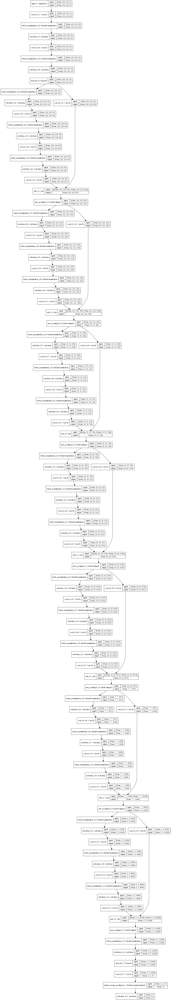

In [159]:
plot_model(modelc, show_shapes=True)

In [26]:

backbone = ResNet152V2(include_top=False, weights=None,
                       input_tensor=Input(shape=(224, 224, 3)))

neck = backbone.output
neck = Flatten(name="flatten")(neck)
neck = Dense(512, activation="relu")(neck)


def build_tower(in_layer):
    # redundant
#     neck = Dropout(0.2)(in_layer)
#     neck = Dense(128, activation="relu")(neck)
    neck = Dropout(0.3)(in_layer)
    neck = Dense(128, activation="relu")(neck)
    return neck


def build_head(name, incoming):
    return Dense(
        num_units[name], activation="softmax", name=f"{name}_output"
    )(incoming)

# heads
gender = build_head("gender", build_tower(neck))
image_quality = build_head("image_quality", build_tower(neck))
age = build_head("age", build_tower(neck))
weight = build_head("weight", build_tower(neck))
bag = build_head("bag", build_tower(neck))
footwear = build_head("footwear", build_tower(neck))
emotion = build_head("emotion", build_tower(neck))
pose = build_head("pose", build_tower(necmodek))


model = Model(
    inputs=backbone.input, 
    outputs=[gender, image_quality, age, weight, bag, footwear, pose, emotion]
)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\type_check.py:546: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  'a.item() instead', DeprecationWarning, stacklevel=1)


In [ ]:
ResNet152V2(include_top=False, weights='None', input_shape=None, pooling=None)


In [ ]:
input_shape = (224, 224, 3)
inputs = Input(shape=input_shape, name='input')

def separable(inputs, channels=32,name='', padding='valid', dropout=0.05, ):
    kernel_size=3
    
    filters=channels
    output = SeparableConv2D(filters, kernel_size, use_bias=False, padding=padding, name='separable_block'+name+'L1')(inputs)
    output = Activation('relu')(output)
    output = BatchNormalization()(output)
    output = Dropout(dropout)(output)

    filters *= 2
    output = SeparableConv2D(filters, kernel_size, use_bias=False, padding=padding, name='separable_block'+name+'L1')(inputs)
    output = Activation('relu')(output)
    output = BatchNormalization()(output)
    output = Dropout(dropout)(output)
    
    output = MaxPooling2D(2)(output)
    output = Conv2D(channles, 1, use_bias=False, name='separable_block'+name+'L3_Pointwise')(inputs)

    return output
def conv(inputs,channels=32,padding='valid' name='', dropout=0.05):
    kernel_size=3
    
    filters=channels
    output = Conv2D(filters, kernel_size, padding=padding, use_bias=False, name='Conv2D_'+name+'_L1')(inputs)
    output = Activation('relu')(output)
    output = BatchNormalization()(output)
    output = Dropout(dropout)(output)
    
    filters *= 2 
    output = Conv2D(filters, kernel_size, padding=padding, use_bias=False, name='Conv2D_block'+name+'_L2')(inputs)
    output = Activation('relu')(output)
    output = BatchNormalization()(output)
    output = Dropout(dropout)(output)
    
    output = MaxPooling2D(2)(output)
    output = Conv2D(channles, 1, use_bias=False, name='Conv2D_block'+name+'_L3_Pointwise')(inputs)

    return output


In [ ]:
# heads
gender = build_head("gender", build_tower(neck))
image_quality = build_head("image_quality", build_tower(neck))
age = build_head("age", build_tower(neck))
weight = build_head("weight", build_tower(neck))
bag = build_head("bag", build_tower(neck))
footwear = build_head("footwear", build_tower(neck))
emotion = build_head("emotion", build_tower(neck))
pose = build_head("pose", build_tower(neck))


In [0]:
backbone = VGG16(
    weights="imagenet", 
    include_top=False, 
    input_tensor=Input(shape=(224, 224, 3))
)

neck = backbone.output
neck = Flatten(name="flatten")(neck)
neck = Dense(512, activation="relu")(neck)


def build_tower(in_layer):
    # redundant
#     neck = Dropout(0.2)(in_layer)
#     neck = Dense(128, activation="relu")(neck)
    neck = Dropout(0.3)(in_layer)
    neck = Dense(128, activation="relu")(neck)
    return neck


def build_head(name, incoming):
    return Dense(
        num_units[name], activation="softmax", name=f"{name}_output"
    )(incoming)

# heads
gender = build_head("gender", build_tower(neck))
image_quality = build_head("image_quality", build_tower(neck))
age = build_head("age", build_tower(neck))
weight = build_head("weight", build_tower(neck))
bag = build_head("bag", build_tower(neck))
footwear = build_head("footwear", build_tower(neck))
emotion = build_head("emotion", build_tower(neck))
pose = build_head("pose", build_tower(neck))


model = Model(
    inputs=backbone.input, 
    outputs=[gender, image_quality, age, weight, bag, footwear, pose, emotion]
)












Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
# freeze backbone
for layer in backbone.layers:
	layer.trainable = False

In [0]:
# losses = {
# 	"gender_output": "binary_crossentropy",
# 	"image_quality_output": "categorical_crossentropy",
# 	"age_output": "categorical_crossentropy",
# 	"weight_output": "categorical_crossentropy",

# }
# loss_weights = {"gender_output": 1.0, "image_quality_output": 1.0, "age_output": 1.0}
opt = SGD(lr=0.001, momentum=0.9)
model.compile(
    optimizer=opt,
    loss="categorical_crossentropy", 
    # loss_weights=loss_weights, 
    metrics=["accuracy"]
)

In [0]:
model_info = model.fit_generator(
    generator=train_gen,
    validation_data=valid_gen,
    use_multiprocessing=True,
    workers=6, 
    epochs=5,
    verbose=1
)

Epoch 1/5
2/2 [==============================] - 72s 36s/step - loss: 8.7825 - gender_output_loss: 0.9268 - image_quality_output_loss: 1.2556 - age_output_loss: 1.5120 - weight_output_loss: 1.1199 - bag_output_loss: 0.9973 - footwear_output_loss: 0.9843 - pose_output_loss: 1.1672 - emotion_output_loss: 0.8194 - gender_output_acc: 0.5156 - image_quality_output_acc: 0.3594 - age_output_acc: 0.3594 - weight_output_acc: 0.4531 - bag_output_acc: 0.5781 - footwear_output_acc: 0.5469 - pose_output_acc: 0.5625 - emotion_output_acc: 0.7812 - val_loss: 7.9409 - val_gender_output_loss: 0.8135 - val_image_quality_output_loss: 0.9337 - val_age_output_loss: 1.3870 - val_weight_output_loss: 1.1442 - val_bag_output_loss: 0.9503 - val_footwear_output_loss: 0.9574 - val_pose_output_loss: 0.9503 - val_emotion_output_loss: 0.8046 - val_gender_output_acc: 0.6719 - val_image_quality_output_acc: 0.4844 - val_age_output_acc: 0.5000 - val_weight_output_acc: 0.5156 - val_bag_output_acc: 0.5938 - val_footwear_ou

In [0]:
labels = [key for key, _ in targets.items()]
labels

['gender_output',
 'image_quality_output',
 'age_output',
 'weight_output',
 'bag_output',
 'pose_output',
 'footwear_output',
 'emotion_output']

In [0]:
import matplotlib.pyplot as plt

def plot_training_epochs(history, label):
  acc = label + '_acc'
  val_acc = 'val_' + label + '_acc'

  loss = label + '_loss'
  val_loss = 'val_' + label + '_loss'
  # summarize history for accuracy
  plt.plot(history.history[acc], label='train_acc')
  plt.plot(history.history[val_acc], label='val_acc')
  plt.title(label)
  plt.xlabel('epoch')

  # summarize history for loss
  plt.plot(history.history[loss], label='train_loss')
  plt.plot(history.history[val_loss], label='val_loss')
  plt.legend(loc='upper left')
  plt.show()

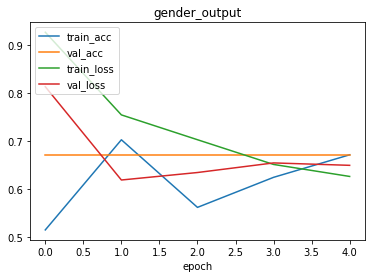

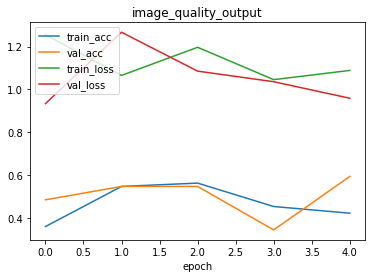

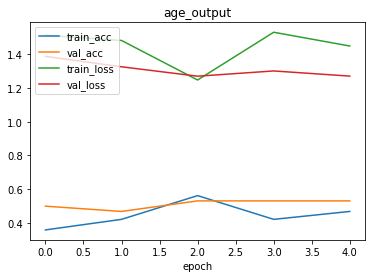

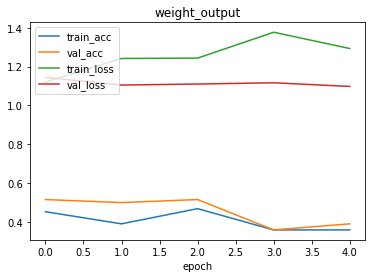

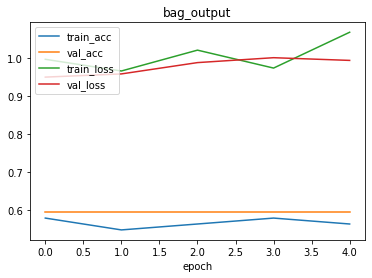

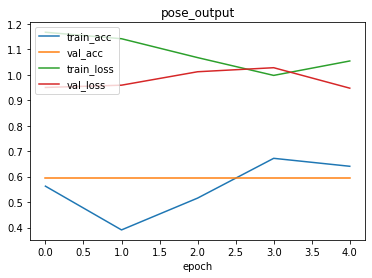

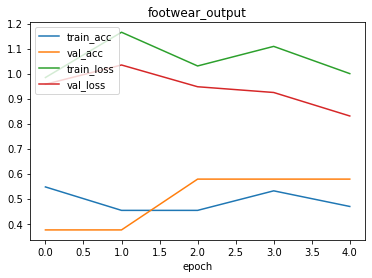

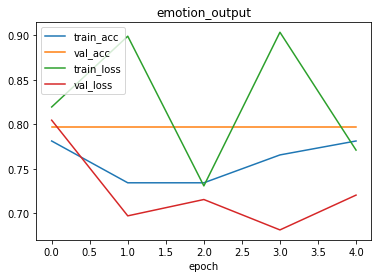

In [0]:
for label in labels:
  plot_training_epochs(model_info, label)

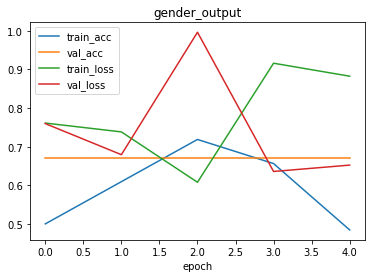

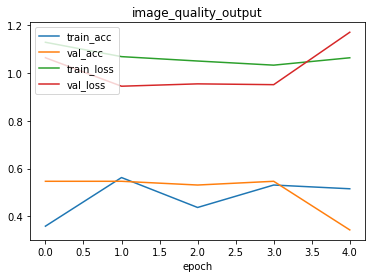

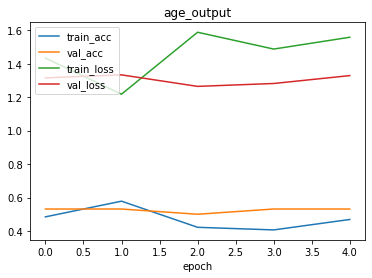

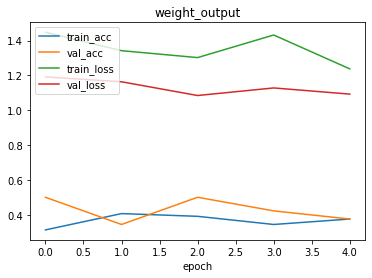

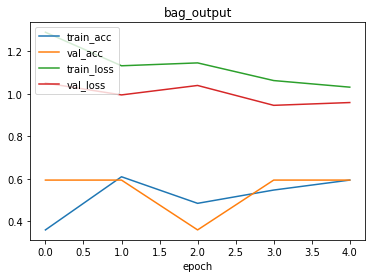

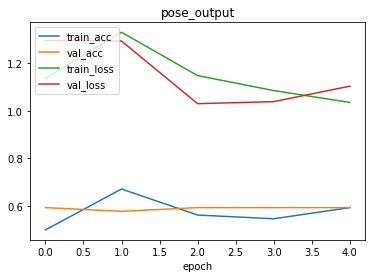

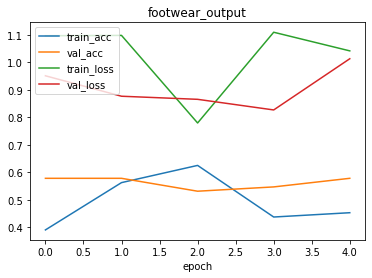

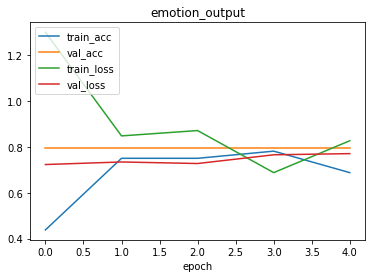

In [0]:
for label in labels:
  plot_training_epochs(model_info, label)

2/2 [==============================] - 33s 17s/step


In [0]:
results = model.evaluate_generator(valid_gen, verbose=1)
dict(zip(model.metrics_names, results))

{'age_output_acc': 0.53125,
 'age_output_loss': 1.2789743542671204,
 'bag_output_acc': 0.59375,
 'bag_output_loss': 0.9790736436843872,
 'emotion_output_acc': 0.796875,
 'emotion_output_loss': 0.7136271744966507,
 'footwear_output_acc': 0.578125,
 'footwear_output_loss': 0.8436903655529022,
 'gender_output_acc': 0.671875,
 'gender_output_loss': 0.6455998420715332,
 'image_quality_output_acc': 0.390625,
 'image_quality_output_loss': 0.9853080809116364,
 'loss': 7.494219779968262,
 'pose_output_acc': 0.59375,
 'pose_output_loss': 0.9632466435432434,
 'weight_output_acc': 0.484375,
 'weight_output_loss': 1.0846996307373047}

In [0]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau

In [0]:
def lr_schedule(epoch):
  lr = round(0.003 * pow(0.5, epoch//2), 10) #  halving lr every 2 epochs
  print ('Learning rate is : ', lr)
  return lr

# Prepare model model saving directory.
save_dir = os.path.join(os.getcwd(), 'saved_models')
model_name = 'vgg_hvc_1_model.{epoch:03d}.h5'
if not os.path.isdir(save_dir):
    os.makedirs(save_dir, exist_ok=True)
filepath = os.path.join(save_dir, model_name)

# Prepare callbacks for model saving and for learning rate adjustment.

checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='val_acc',
                             verbose=1,
                             save_best_only=True)


lr_scheduler = LearningRateScheduler(lr_schedule)

lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               min_lr=0.5e-6)

callbacks = [checkpoint, lr_reducer, lr_scheduler]

In [0]:
model_info = model.fit_generator(
    generator=train_gen,
    validation_data=valid_gen,
    use_multiprocessing=True,
    workers=6, 
    epochs=5,
    verbose=1,
    callbacks=callbacks
)

Epoch 1/5
Learning rate is :  0.003
2/2 [==============================] - 73s 37s/step - loss: 7.9712 - gender_output_loss: 0.6738 - image_quality_output_loss: 0.9946 - age_output_loss: 1.5199 - weight_output_loss: 1.1639 - bag_output_loss: 1.0272 - footwear_output_loss: 1.0503 - pose_output_loss: 0.8667 - emotion_output_loss: 0.6748 - gender_output_acc: 0.6250 - image_quality_output_acc: 0.4375 - age_output_acc: 0.3594 - weight_output_acc: 0.3750 - bag_output_acc: 0.5469 - footwear_output_acc: 0.4688 - pose_output_acc: 0.6719 - emotion_output_acc: 0.8125 - val_loss: 7.7349 - val_gender_output_loss: 0.6209 - val_image_quality_output_loss: 1.0731 - val_age_output_loss: 1.3265 - val_weight_output_loss: 1.1234 - val_bag_output_loss: 0.9603 - val_footwear_output_loss: 0.9442 - val_pose_output_loss: 0.9835 - val_emotion_output_loss: 0.7030 - val_gender_output_acc: 0.6719 - val_image_quality_output_acc: 0.5469 - val_age_output_acc: 0.3750 - val_weight_output_acc: 0.5000 - val_bag_output_acc

/usr/local/lib/python3.6/dist-packages/keras/callbacks.py:707: RuntimeWarning: Can save best model only with val_acc available, skipping.
  'skipping.' % (self.monitor), RuntimeWarning)


2/2 [==============================] - 69s 34s/step - loss: 8.2922 - gender_output_loss: 0.7524 - image_quality_output_loss: 1.1890 - age_output_loss: 1.3438 - weight_output_loss: 1.3020 - bag_output_loss: 0.9999 - footwear_output_loss: 0.9917 - pose_output_loss: 1.0261 - emotion_output_loss: 0.6872 - gender_output_acc: 0.5000 - image_quality_output_acc: 0.5156 - age_output_acc: 0.4375 - weight_output_acc: 0.5156 - bag_output_acc: 0.5469 - footwear_output_acc: 0.4375 - pose_output_acc: 0.6094 - emotion_output_acc: 0.7969 - val_loss: 7.5471 - val_gender_output_loss: 0.6441 - val_image_quality_output_loss: 0.9723 - val_age_output_loss: 1.3152 - val_weight_output_loss: 1.1281 - val_bag_output_loss: 0.9529 - val_footwear_output_loss: 0.8526 - val_pose_output_loss: 0.9523 - val_emotion_output_loss: 0.7295 - val_gender_output_acc: 0.6719 - val_image_quality_output_acc: 0.5469 - val_age_output_acc: 0.5312 - val_weight_output_acc: 0.3281 - val_bag_output_acc: 0.5938 - val_footwear_output_acc: 

In [0]:
results = model.evaluate_generator(valid_gen, verbose=1)
dict(zip(model.metrics_names, results))

2/2 [==============================] - 33s 16s/step


{'age_output_acc': 0.53125,
 'age_output_loss': 1.2733455300331116,
 'bag_output_acc': 0.59375,
 'bag_output_loss': 0.9530223309993744,
 'emotion_output_acc': 0.796875,
 'emotion_output_loss': 0.7359009385108948,
 'footwear_output_acc': 0.578125,
 'footwear_output_loss': 0.8264914453029633,
 'gender_output_acc': 0.671875,
 'gender_output_loss': 0.6314684748649597,
 'image_quality_output_acc': 0.546875,
 'image_quality_output_loss': 0.9932706952095032,
 'loss': 7.452946901321411,
 'pose_output_acc': 0.59375,
 'pose_output_loss': 0.9742444157600403,
 'weight_output_acc': 0.5,
 'weight_output_loss': 1.0652029514312744}

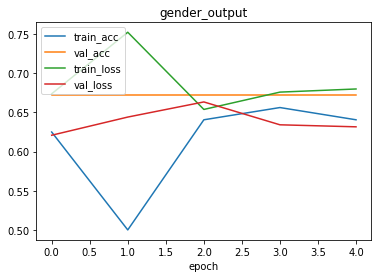

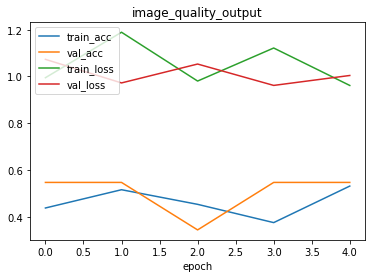

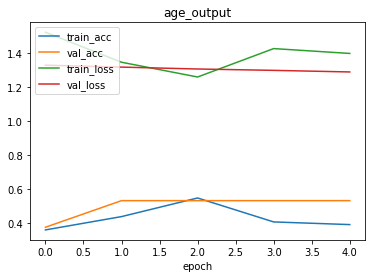

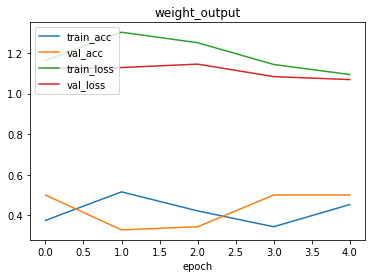

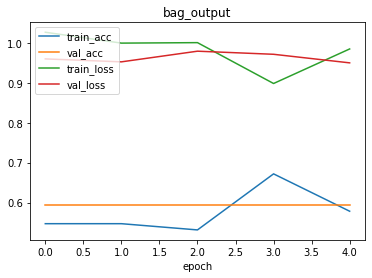

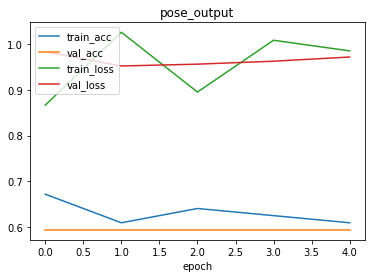

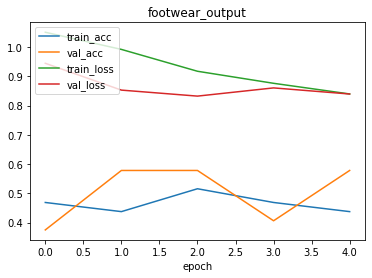

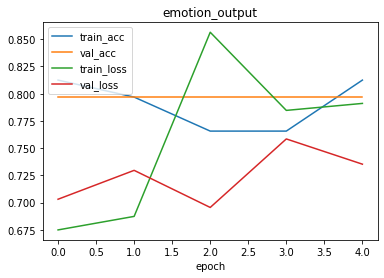

In [0]:
for label in labels:
  plot_training_epochs(model_info, label)

In [0]:


# # checking some random images
# fig = plt.figure(figsize=(10,5))
# for i in range(num_classes):
#   ax = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
#   idx = np.where(y_train[:]==i)[0] # selecting image_idx of single class
#   features = x_train[idx,::]
#   img_num = np.random.randint(features.shape[0])
#   im = features[img_num]
#   ax.set_title(class_names[i])
#   plt.imshow(im)
# plt.show()


# # display n random images for each class
# n = 10
# r, c = 10, n
# fig = plt.figure(figsize=(10,10))
# fig.subplots_adjust(hspace=0.01, wspace=0.01)
# for i in range(num_classes):
#     idx = np.random.choice(np.where(y_train[:]==i)[0], c, replace=False)
#     ax = plt.subplot(r, c, i*c+1)
#     ax.text(-1.5, 0.5, class_names[i], fontsize=14)
#     plt.axis('off')
#     for j in range(1, c):
#       plt.subplot(r, c, i*c+j+1)
#       plt.imshow(x_train[idx[j-1]], interpolation='none')
#       plt.axis('off')
# plt.show()

In [0]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

['/job:localhost/replica:0/task:0/device:GPU:0']

In [0]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices()) # list of DeviceAttributes

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 2785027350564102718
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4951913267
locality {
  bus_id: 1
  links {
  }
}
incarnation: 4807772686025660392
physical_device_desc: "device: 0, name: GeForce GTX 1060, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


In [0]:
import tensorflow as tf
tf.test.is_gpu_available() # True/False

True

In [0]:
# Or only check for gpu's with cuda support
tf.test.is_gpu_available(cuda_only=True) 

True

In [0]:
a = np.random.uniform(low=0, high=255, size=(10,32,32,3))

In [0]:
a

array([[[[1.27585603e+02, 3.25460126e+01, 7.79283066e+01],
         [1.70839082e+02, 1.57297408e-01, 3.86185582e+01],
         [1.76328884e+02, 1.54596652e+02, 2.33121628e+02],
         ...,
         [2.31363788e+02, 5.71377869e+00, 7.16094464e+01],
         [2.23426236e+02, 1.55311589e+01, 1.24620324e+02],
         [1.54591580e+02, 2.16731602e+02, 2.15383715e+02]],

        [[2.44851704e+02, 3.24262800e+01, 6.03719302e+01],
         [1.03985182e+02, 1.64772514e+02, 1.79673482e+02],
         [2.17943032e+02, 1.25824198e+02, 5.00939881e+00],
         ...,
         [2.11637380e+02, 1.47452629e+02, 2.07640810e+02],
         [4.95952850e+01, 1.62173611e+02, 4.79476001e+01],
         [1.75768877e+02, 3.95225851e+01, 2.16237439e+02]],

        [[6.06966513e+01, 2.47324812e+02, 1.92106703e+02],
         [4.36843349e+01, 2.46826788e+02, 2.17501069e+02],
         [1.99176266e+02, 2.10746780e+02, 1.39805801e+02],
         ...,
         [6.01348524e+01, 4.99465160e+01, 1.65431186e+02],
         [

In [0]:
a = a/255.0

In [0]:
a

array([[[[5.00335700e-01, 1.27631422e-01, 3.05601202e-01],
         [6.69957183e-01, 6.16852580e-04, 1.51445326e-01],
         [6.91485818e-01, 6.06261382e-01, 9.14202461e-01],
         ...,
         [9.07308973e-01, 2.24069753e-02, 2.80821358e-01],
         [8.76181317e-01, 6.09065054e-02, 4.88707155e-01],
         [6.06241489e-01, 8.49927852e-01, 8.44642019e-01]],

        [[9.60202760e-01, 1.27161883e-01, 2.36752668e-01],
         [4.07785029e-01, 6.46166722e-01, 7.04601892e-01],
         [8.54678555e-01, 4.93428226e-01, 1.96447012e-02],
         ...,
         [8.29950509e-01, 5.78245604e-01, 8.14277684e-01],
         [1.94491314e-01, 6.35974947e-01, 1.88029804e-01],
         [6.89289715e-01, 1.54990530e-01, 8.47989958e-01]],

        [[2.38026084e-01, 9.69901223e-01, 7.53359618e-01],
         [1.71311117e-01, 9.67948188e-01, 8.52945369e-01],
         [7.81083396e-01, 8.26457959e-01, 5.48258045e-01],
         ...,
         [2.35822951e-01, 1.95868690e-01, 6.48749749e-01],
         [

In [215]:
class PersonDataGenerator(keras.utils.Sequence):
    def __init__(self, df, batch_size=32, shuffle=True, aug_list=[], incl_orig=True):
        self.df = df
        self.batch_size=batch_size
        self.shuffle = shuffle
        self.on_epoch_end()
        
        self.aug_list = aug_list
        self.incl_orig = incl_orig
        self.orig_len = int(np.floor(self.df.shape[0] / self.batch_size))

    def __len__(self):
        if self.incl_orig:
            delta = 1
        else:
            delta = 0
#         print('values of self.df.shape[0], self.batch_size,  self.orig_len, len(self.aug_list), delta', self.df.shape[0], self.batch_size,  self.orig_len, len(self.aug_list), delta)
#         print('len : ', self.orig_len * (len(self.aug_list) + delta))
        return self.orig_len * (len(self.aug_list) + delta)

    def __getitem__(self, index):
        if not self.incl_orig :
            index += self.orig_len - 1

#         print('Index : ', index)
#         print('self.orig_len : ', self.orig_len)
        
        if index > self.orig_len - 1:
            aug = self.aug_list[index // self.orig_len - 1]
            index %= self.orig_len
#             print('Inside if condition - aug_ele : ', (index // self.orig_len - 1), self.aug_list[index // self.orig_len - 1])
        else:
            aug = None

#         print('Index : ', index)
        
        batch_slice = slice(index * self.batch_size, (index + 1) * self.batch_size)
        items = self.df.iloc[batch_slice]
        
        images = np.stack([cv2.imread(item["image_path"]) for _, item in items.iterrows()])        
        
        if aug is not None:
            images = aug.flow(images, shuffle=False).next()
#             print('Augmentation is done')
        
        target = {
            "gender_output": items[_gender_cols_].values,
            "image_quality_output": items[_imagequality_cols_].values,
            "age_output": items[_age_cols_].values,
            "weight_output": items[_weight_cols_].values,
            "bag_output": items[_carryingbag_cols_].values,
            "pose_output": items[_bodypose_cols_].values,
            "footwear_output": items[_footwear_cols_].values,
            "emotion_output": items[_emotion_cols_].values,
        }
        
        return images, target
    def on_epoch_end(
self):
        """Updates indexes after each epoch"""
        if self.shuffle == True:
            self.df = self.df.sample(frac=1).reset_index(drop=True)


In [216]:
train_gen = PersonDataGenerator(
    train_df, 
    batch_size=32, 
    aug_list=[
        ImageDataGenerator(rotation_range=45),
        ImageDataGenerator(horizontal_flip=True),
        ImageDataGenerator(vertical_flip=True),
    ],
    incl_orig=True,  # Whether to include original images
)


In [217]:
len(train_gen)

1016

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


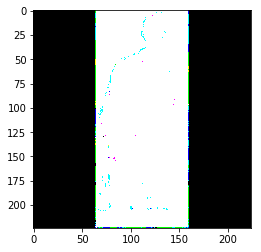

In [233]:
plt.imshow(train_gen[1000][0][0])
# train_gen[0][0][0].shape

In [190]:
images_ge, targets = next(iter(train_gen))

values of self.df.shape[0], self.batch_size,  self.orig_len, len(self.aug_list), delta 8143 32 254 3 1
len :  1016
Index :  0
self.orig_len :  254
Index :  0


In [147]:
images_ge, targets = next(iter(train_gen))

values of self.df.shape[0], self.batch_size,  self.orig_len, len(self.aug_list), delta 8143 32 254 3 0
Index :  253
self.orig_len :  254
Index :  253


In [148]:
len(images_ge)

32